In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
from scipy.signal import find_peaks
from scipy.ndimage import gaussian_filter1d
import pandas as pd

In [2]:
# Load image
img = cv2.imread(r"E:\Jain Irrigation\data\A\train_cropped\IMG_20250920_110830496_HDR.jpg")
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
# Total pixels
total_pixels = img.shape[0] * img.shape[1]
print("Total pixels:", total_pixels)

Total pixels: 684800


In [3]:
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
blur = cv2.GaussianBlur(gray, (5,5), 0)
edges = cv2.Canny(blur, 50, 150, apertureSize=3)

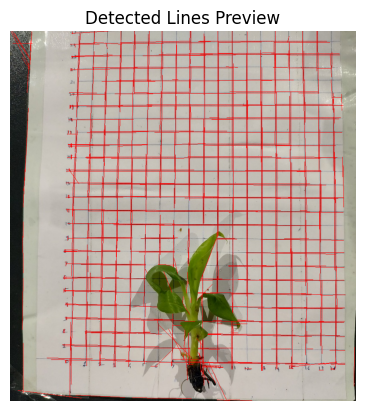

In [4]:
lines = cv2.HoughLinesP(edges, 1, np.pi/180, threshold=55,
                        minLineLength=5, maxLineGap=15)

preview = img.copy()
if lines is not None:
    for x1, y1, x2, y2 in lines[:, 0]:
        cv2.line(preview, (x1, y1), (x2, y2), (0, 0, 255), 1)

plt.imshow(cv2.cvtColor(preview, cv2.COLOR_BGR2RGB))
plt.title("Detected Lines Preview")
plt.axis("off")
plt.show()

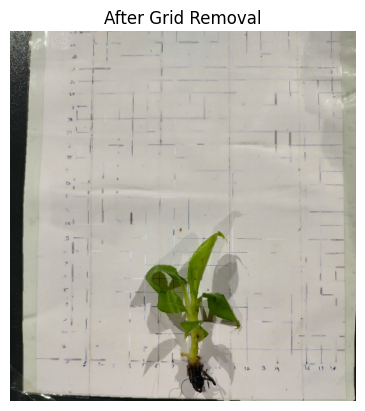

In [5]:
mask_lines = np.ones_like(gray, dtype=np.uint8) * 255
if lines is not None:
    for x1, y1, x2, y2 in lines[:, 0]:
        cv2.line(mask_lines, (x1, y1), (x2, y2), 0, 2)

# Invert and inpaint to remove detected lines
mask_inv = cv2.bitwise_not(mask_lines)
img_no_grid = cv2.inpaint(img, mask_inv, 3, cv2.INPAINT_TELEA)

plt.imshow(cv2.cvtColor(img_no_grid, cv2.COLOR_BGR2RGB))
plt.title("After Grid Removal")
plt.axis("off")
plt.show()

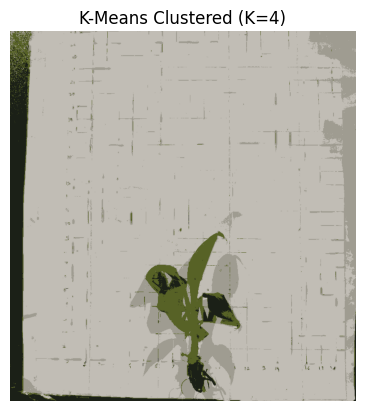

In [48]:
# Flatten image for clustering
Z = img_no_grid.reshape((-1, 3))
Z = np.float32(Z)

K = 4   # try 4 instead of 3 to separate root & leaf better
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 20, 1.0)
ret, label, center = cv2.kmeans(Z, K, None, criteria, 10, cv2.KMEANS_RANDOM_CENTERS)

center = np.uint8(center)
res = center[label.flatten()]
res2 = res.reshape(img.shape)

plt.imshow(cv2.cvtColor(res2, cv2.COLOR_BGR2RGB))
plt.title("K-Means Clustered (K=4)")
plt.axis("off")
plt.show()

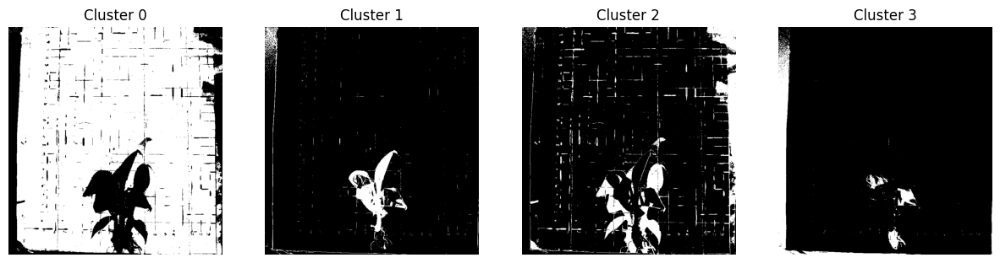

Cluster 0 center (HSV): [ 20  16 193]
Cluster 1 center (HSV): [ 36 156  98]
Cluster 2 center (HSV): [ 24  22 159]
Cluster 3 center (HSV): [47 72 32]


In [49]:
labels = label.reshape(img.shape[:2])
unique_labels = np.unique(labels)

fig, axs = plt.subplots(1, len(unique_labels), figsize=(15, 5))
for i, ul in enumerate(unique_labels):
    mask = (labels == ul).astype(np.uint8) * 255
    axs[i].imshow(mask, cmap="gray")
    axs[i].set_title(f"Cluster {ul}")
    axs[i].axis("off")

plt.show()

# Print HSV color centers for identification
center_hsv = cv2.cvtColor(center[np.newaxis, :, :], cv2.COLOR_BGR2HSV)[0]
for i, c in enumerate(center_hsv):
    print(f"Cluster {i} center (HSV): {c}")

In [11]:
clean = cv2.bitwise_and(img, img, mask=fg_mask)

In [12]:
hsv = cv2.cvtColor(clean, cv2.COLOR_BGR2HSV)

In [13]:
lower_leaf = np.array([30, 40, 40])
upper_leaf = np.array([90, 255, 255])
leaf_mask = cv2.inRange(hsv, lower_leaf, upper_leaf)

In [14]:
lower_root = np.array([0, 0, 0])
upper_root = np.array([40, 255, 100])
root_mask = cv2.inRange(hsv, lower_root, upper_root)

In [15]:
leaf_mask = cv2.morphologyEx(leaf_mask, cv2.MORPH_OPEN, kernel)
root_mask = cv2.morphologyEx(root_mask, cv2.MORPH_OPEN, kernel)

In [16]:
cv2.imshow("Foreground (clean)", clean)
cv2.imshow("Leaf Mask", leaf_mask)
cv2.imshow("Root Mask", root_mask)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [11]:
image = cv2.imread(r"E:\Jain Irrigation\data\A\train_cropped\IMG_20250920_110933781.jpg")
hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
H, S, V = cv2.split(hsv)

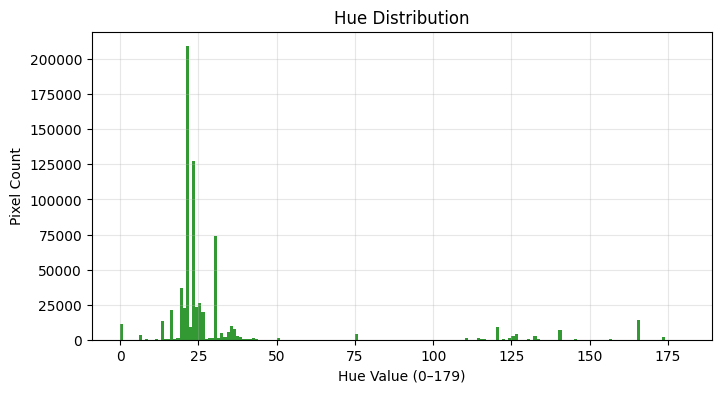

In [14]:
plt.figure(figsize=(8,4))
plt.hist(H.ravel(), bins=180, range=[0,180], color='green', alpha=0.8)
plt.title("Hue Distribution")
plt.xlabel("Hue Value (0–179)")
plt.ylabel("Pixel Count")
plt.grid(True, alpha=0.3)
plt.show()

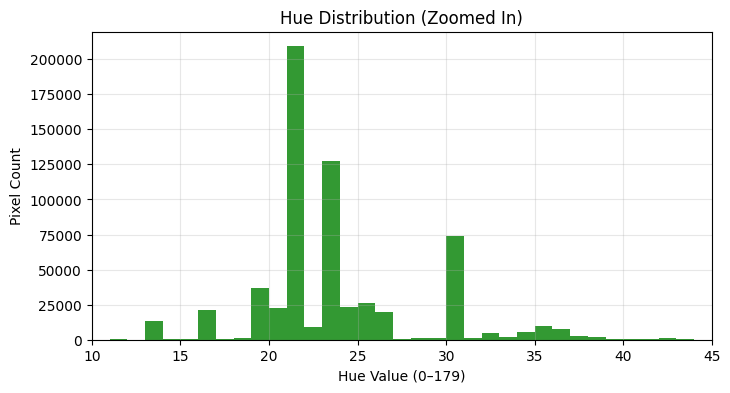

In [16]:
plt.figure(figsize=(8,4))
plt.hist(H.ravel(), bins=180, range=[0,180], color='green', alpha=0.8)
plt.xlim(10, 45)   # 👈 Zoom into hue range 10–60
plt.title("Hue Distribution (Zoomed In)")
plt.xlabel("Hue Value (0–179)")
plt.ylabel("Pixel Count")
plt.grid(True, alpha=0.3)
plt.show()

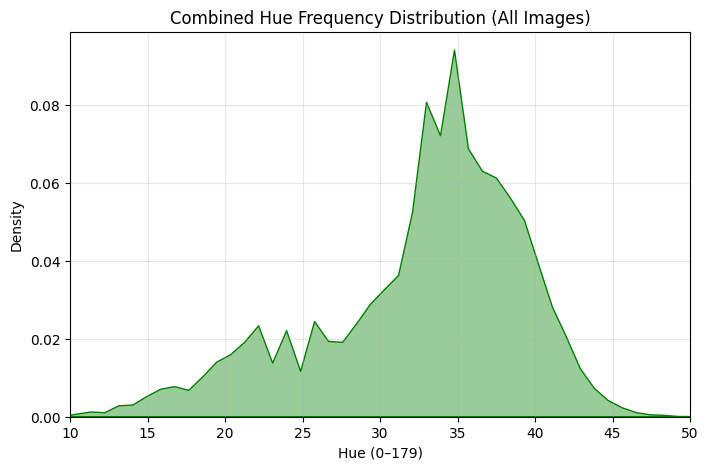

Suggested dataset-wide hue range: 16.0 – 118.0


In [22]:
input_dir = r"E:\Jain Irrigation\data\A\train_cropped"

all_hues = []

# Loop through all images
for file in os.listdir(input_dir):
    if file.lower().endswith(('.jpg', '.jpeg', '.png')):
        path = os.path.join(input_dir, file)
        img = cv2.imread(path)
        if img is None:
            continue

        hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
        H, S, V = cv2.split(hsv)

        # Filter out low-saturation & low-brightness pixels (non-leaf)
        mask = (S > 40) & (V > 40)
        H_valid = H[mask]

        all_hues.extend(H_valid.flatten())

all_hues = np.array(all_hues)

# Plot frequency distribution (KDE curve)
plt.figure(figsize=(8,5))
sns.kdeplot(all_hues, bw_adjust=0.5, color='green', fill=True, alpha=0.4)
plt.xlim(10, 50)  # focus on the green region
plt.title("Combined Hue Frequency Distribution (All Images)")
plt.xlabel("Hue (0–179)")
plt.ylabel("Density")
plt.grid(True, alpha=0.3)
plt.show()

# Compute main range numerically
min_h, max_h = np.percentile(all_hues, [2, 98])
print(f"Suggested dataset-wide hue range: {min_h:.1f} – {max_h:.1f}")

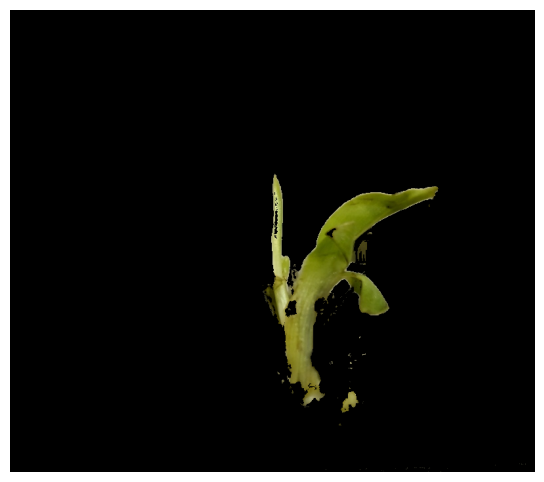

In [44]:
# Read image
image = cv2.imread(r"E:\Jain Irrigation\data\D\train_cropped\IMG_20250922_120644195_HDR.jpg")
hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
H, S, V = cv2.split(hsv)

# Define hue range
lower = np.array([27, 60, 40])   # lower hue, min saturation/value
upper = np.array([60, 255, 230]) # upper hue, avoid too bright

# Create mask for that hue range
mask = cv2.inRange(hsv, lower, upper)

# Optional: keep only sufficiently saturated and bright pixels
mask = cv2.bitwise_and(mask, cv2.inRange(S, 40, 255))
mask = cv2.bitwise_and(mask, cv2.inRange(V, 40, 255))

# Apply mask to the original image
result = cv2.bitwise_and(image, image, mask=mask)

# Show result
plt.figure(figsize=(10,6))
plt.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
plt.axis("off")
plt.show()

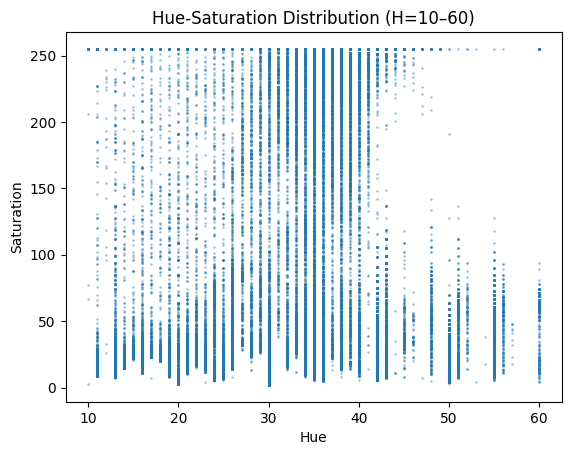

In [37]:
mask = (H >= 10) & (H <= 60)
plt.scatter(H[mask].flatten(), S[mask].flatten(), alpha=0.3, s=1)
plt.xlabel('Hue')
plt.ylabel('Saturation')
plt.title('Hue-Saturation Distribution (H=10–60)')
plt.show()

In [82]:
input_folder = r"E:\Jain Irrigation\data\D\test_cropped"
output_folder  = r"E:\Jain Irrigation\data\D\test_bgrmv"
os.makedirs(output_folder , exist_ok=True)

In [83]:
def extract_green_region(image):
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    lower = np.array([25, 60, 40])
    upper = np.array([60, 255, 250])
    mask = cv2.inRange(hsv, lower, upper)
    h, s, v = cv2.split(hsv)
    mask = cv2.bitwise_and(mask, cv2.inRange(s, 40, 255))
    mask = cv2.bitwise_and(mask, cv2.inRange(v, 40, 255))
    result = cv2.bitwise_and(image, image, mask=mask)
    return result


In [84]:
for filename in os.listdir(input_folder):
    if filename.lower().endswith(('.jpg', '.jpeg', '.png')):
        path = os.path.join(input_folder, filename)
        image = cv2.imread(path)
        processed = extract_green_region(image)
        save_path = os.path.join(output_folder, filename)
        cv2.imwrite(save_path, processed)

print("✅ Processing complete. Saved results to:", output_folder)

✅ Processing complete. Saved results to: E:\Jain Irrigation\data\D\test_bgrmv


In [1]:
import os
import cv2
import numpy as np

In [2]:
input_dir = r"E:\Jain Irrigation\data\A\train_cropped"
output_dir = r"E:\Jain Irrigation\data\A\train_bgrmv"
os.makedirs(output_dir, exist_ok=True)

In [9]:
def remove_shadows(img):
    lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
    l, a, b = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    l = clahe.apply(l)
    merged = cv2.merge((l, a, b))
    return cv2.cvtColor(merged, cv2.COLOR_LAB2BGR)

def extract_leaf(image):
    # 1️⃣ Shadow removal
    img_shadow_free = remove_shadows(image)

    # 2️⃣ HSV color segmentation
    hsv = cv2.cvtColor(img_shadow_free, cv2.COLOR_BGR2HSV)
    lower_green = np.array([25, 40, 20])
    upper_green = np.array([90, 255, 255])
    mask_hsv = cv2.inRange(hsv, lower_green, upper_green)

    # 3️⃣ Excess Green (ExG)
    B, G, R = cv2.split(image)
    exg = 2 * G.astype(np.int32) - R.astype(np.int32) - B.astype(np.int32)
    exg = np.clip(exg, 0, 255).astype(np.uint8)
    _, mask_exg = cv2.threshold(exg, 25, 255, cv2.THRESH_BINARY)

    # Combine both masks
    combined_mask = cv2.bitwise_and(mask_hsv, mask_exg)

    # Morphological cleaning
    kernel = np.ones((5, 5), np.uint8)
    combined_mask = cv2.morphologyEx(combined_mask, cv2.MORPH_CLOSE, kernel)
    combined_mask = cv2.morphologyEx(combined_mask, cv2.MORPH_OPEN, kernel)

    # Keep only the largest connected area (the leaf)
    contours, _ = cv2.findContours(combined_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if contours:
        largest = max(contours, key=cv2.contourArea)
        mask_final = np.zeros_like(combined_mask)
        cv2.drawContours(mask_final, [largest], -1, 255, -1)
    else:
        mask_final = combined_mask

    # Apply mask to original
    result = cv2.bitwise_and(image, image, mask=mask_final)
    background = np.zeros_like(image)
    leaf_only = np.where(mask_final[..., None] == 255, result, background)
    return leaf_only

In [10]:
for filename in os.listdir(input_dir):
    if filename.lower().endswith(('.jpg', '.jpeg', '.png')):
        img_path = os.path.join(input_dir, filename)
        image = cv2.imread(img_path)
        if image is None:
            continue
        leaf_only = extract_leaf(image)
        save_path = os.path.join(output_dir, filename)
        cv2.imwrite(save_path, leaf_only)
        print(f"Saved: {save_path}")

print("✅ Leaf extraction completed for all images.")

Saved: E:\Jain Irrigation\data\A\train_bgrmv\IMG_20250920_110830496_HDR.jpg
Saved: E:\Jain Irrigation\data\A\train_bgrmv\IMG_20250920_110834031.jpg
Saved: E:\Jain Irrigation\data\A\train_bgrmv\IMG_20250920_110933781.jpg
Saved: E:\Jain Irrigation\data\A\train_bgrmv\IMG_20250920_110956857_HDR.jpg
Saved: E:\Jain Irrigation\data\A\train_bgrmv\IMG_20250920_111112931.jpg
Saved: E:\Jain Irrigation\data\A\train_bgrmv\IMG_20250920_111124376.jpg
Saved: E:\Jain Irrigation\data\A\train_bgrmv\IMG_20250920_111159428.jpg
Saved: E:\Jain Irrigation\data\A\train_bgrmv\IMG_20250920_111208760.jpg
Saved: E:\Jain Irrigation\data\A\train_bgrmv\IMG_20250920_111242036.jpg
Saved: E:\Jain Irrigation\data\A\train_bgrmv\IMG_20250920_111256139_HDR.jpg
Saved: E:\Jain Irrigation\data\A\train_bgrmv\IMG_20250920_111345470.jpg
Saved: E:\Jain Irrigation\data\A\train_bgrmv\IMG_20250920_111355663.jpg
Saved: E:\Jain Irrigation\data\A\train_bgrmv\IMG_20250920_111445694_HDR.jpg
Saved: E:\Jain Irrigation\data\A\train_bgrmv\IMG

In [18]:
def plot_green_strength_overlay(image_path, curve_color=(0, 100, 0), curve_thickness=2):
    # --- Load image ---
    img = cv2.imread(image_path)
    if img is None:
        raise ValueError(f"Could not read image from {image_path}")
    h, w, _ = img.shape

    # --- Compute Green Strength (−a channel) ---
    lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
    _, a, _ = cv2.split(lab)
    a_centered = a.astype(np.float32) - 128
    green_strength = -a_centered
    row_green_mean = np.mean(green_strength, axis=1)

    # --- Normalize curve to image width ---
    curve = (row_green_mean - row_green_mean.min()) / (np.ptp(row_green_mean) + 1e-5)
    curve_x = curve * 0.25 * w + 0.7 * w   # 70–95% width
    curve_y = np.arange(h)

    # --- Overlay curve directly on the image ---
    overlay = cv2.cvtColor(img.copy(), cv2.COLOR_BGR2RGB)
    for i in range(1, h):
        x1, y1 = int(curve_x[i-1]), int(curve_y[i-1])
        x2, y2 = int(curve_x[i]), int(curve_y[i])
        cv2.line(overlay, (x1, y1), (x2, y2), curve_color, curve_thickness)

    # --- Display without padding ---
    plt.figure(figsize=(w/100, h/100), dpi=100)
    plt.imshow(overlay)
    plt.axis("off")
    plt.subplots_adjust(left=0, right=1, top=1, bottom=0)
    plt.show()

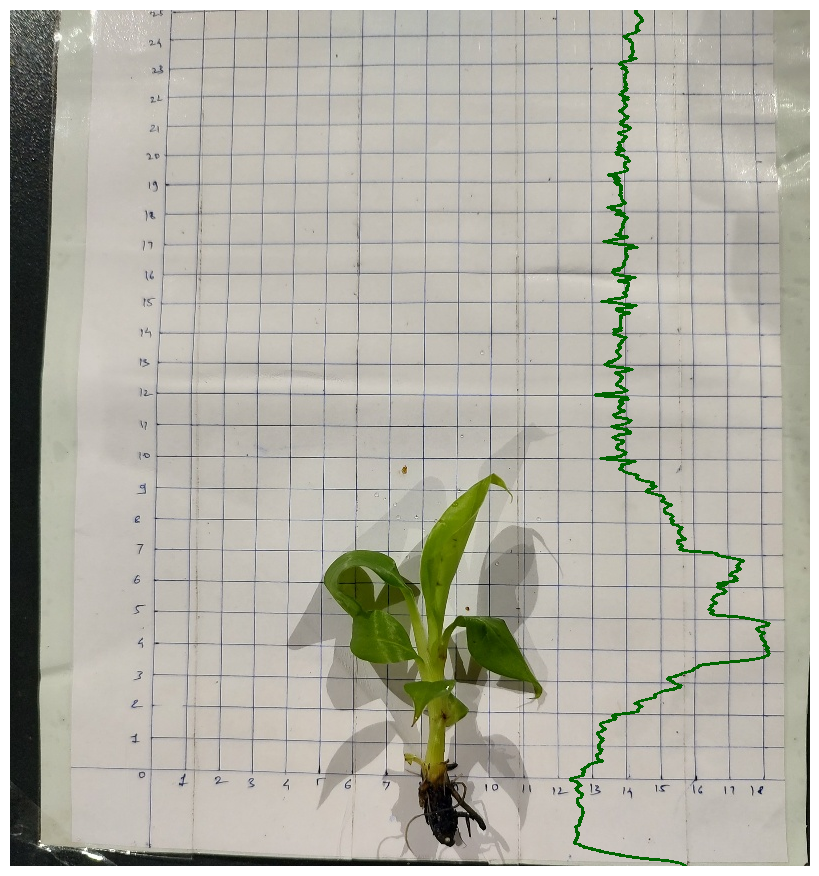

In [19]:
plot_green_strength_overlay(r"E:\Jain Irrigation\data\A\train_cropped\IMG_20250920_110830496_HDR.jpg")

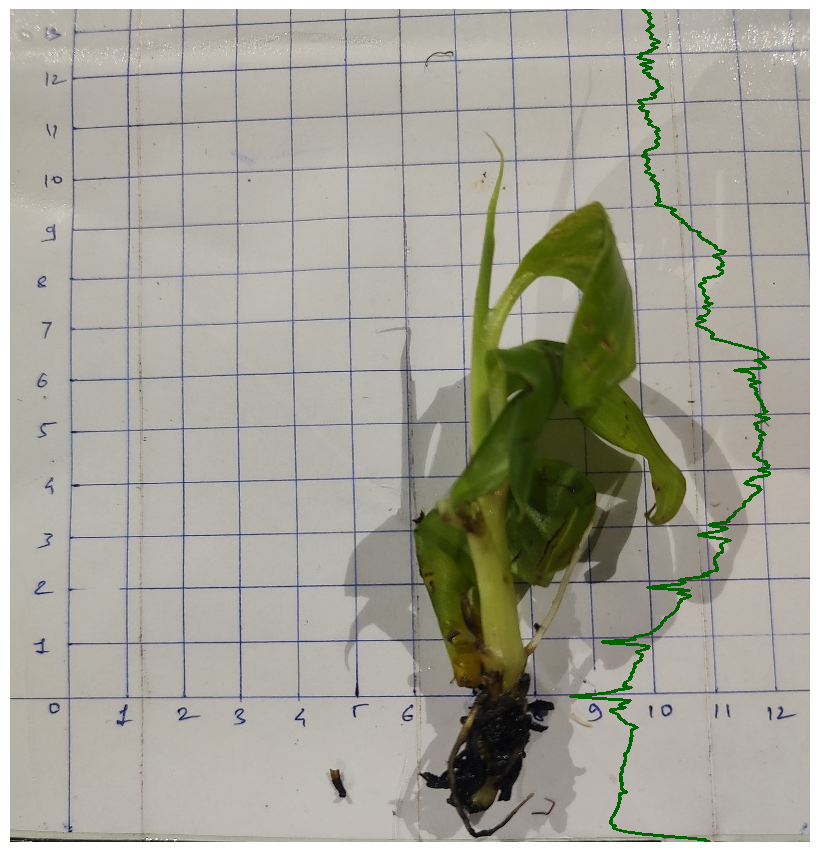

In [20]:
plot_green_strength_overlay(r"E:\Jain Irrigation\data\A\test_cropped\IMG_20250920_114349302.jpg")

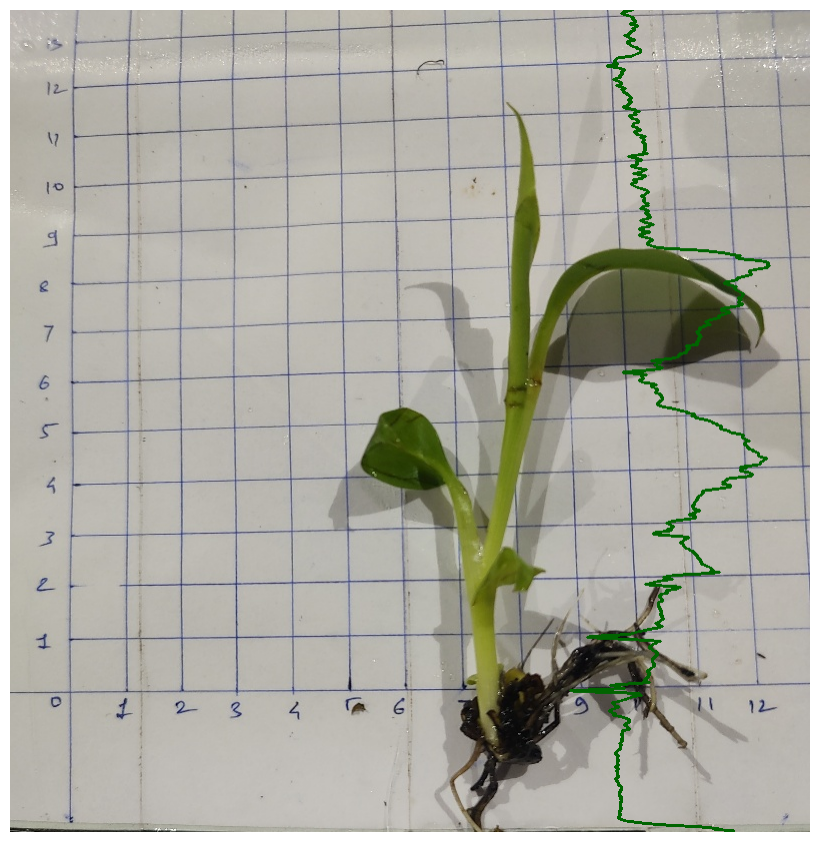

In [21]:
plot_green_strength_overlay(r"E:\Jain Irrigation\data\A\test_cropped\IMG_20250920_114642676.jpg")

In [29]:
def find_topmost_true_green(image_path, curve_color=(0, 100, 0), curve_thickness=2, a_thresh=-5):
    """
    Detects the topmost 'true green' pixel using LAB color space (−a axis),
    and overlays the green strength line plus marker on the image.
    
    a_thresh: threshold below neutral (128) for considering a pixel as green.
              e.g., -5 means a < 123 → green region.
    """
    
    img = cv2.imread(image_path)
    if img is None:
        raise ValueError(f"Could not read image from {image_path}")
    h, w, _ = img.shape

    # --- LAB conversion and green map ---
    lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
    L, a, b = cv2.split(lab)
    a_centered = a.astype(np.float32) - 128  # green < 0, red > 0
    green_strength = -a_centered
    row_green_mean = np.mean(green_strength, axis=1)

    # --- Create mask of 'true green' pixels ---
    green_mask = (a_centered < a_thresh).astype(np.uint8)

    # --- Find topmost green pixel ---
    ys, xs = np.where(green_mask > 0)
    if len(ys) == 0:
        raise ValueError("No green pixels detected using LAB threshold.")
    top_y = np.min(ys)
    top_x = xs[np.argmin(ys)]

    # --- Normalize green-strength curve ---
    curve = (row_green_mean - row_green_mean.min()) / (np.ptp(row_green_mean) + 1e-5)
    curve_x = curve * 0.25 * w + 0.7 * w
    curve_y = np.arange(h)

    # --- Overlay on image ---
    overlay = cv2.cvtColor(img.copy(), cv2.COLOR_BGR2RGB)
    for i in range(1, h):
        x1, y1 = int(curve_x[i-1]), int(curve_y[i-1])
        x2, y2 = int(curve_x[i]), int(curve_y[i])
        cv2.line(overlay, (x1, y1), (x2, y2), curve_color, curve_thickness)

    # Mark topmost true green pixel
    cv2.circle(overlay, (top_x, top_y), 10, (255, 0, 0), 2)
    text = f"({top_x}, {top_y})"
    cv2.putText(
        overlay, text, (top_x + 15, top_y - 10),
        cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 0, 0), 2, cv2.LINE_AA
    )

    # --- Show image ---
    plt.figure(figsize=(w/100, h/100), dpi=100)
    plt.imshow(overlay)
    plt.axis("off")
    plt.subplots_adjust(left=0, right=1, top=1, bottom=0)
    plt.show()

    return (top_x, top_y)

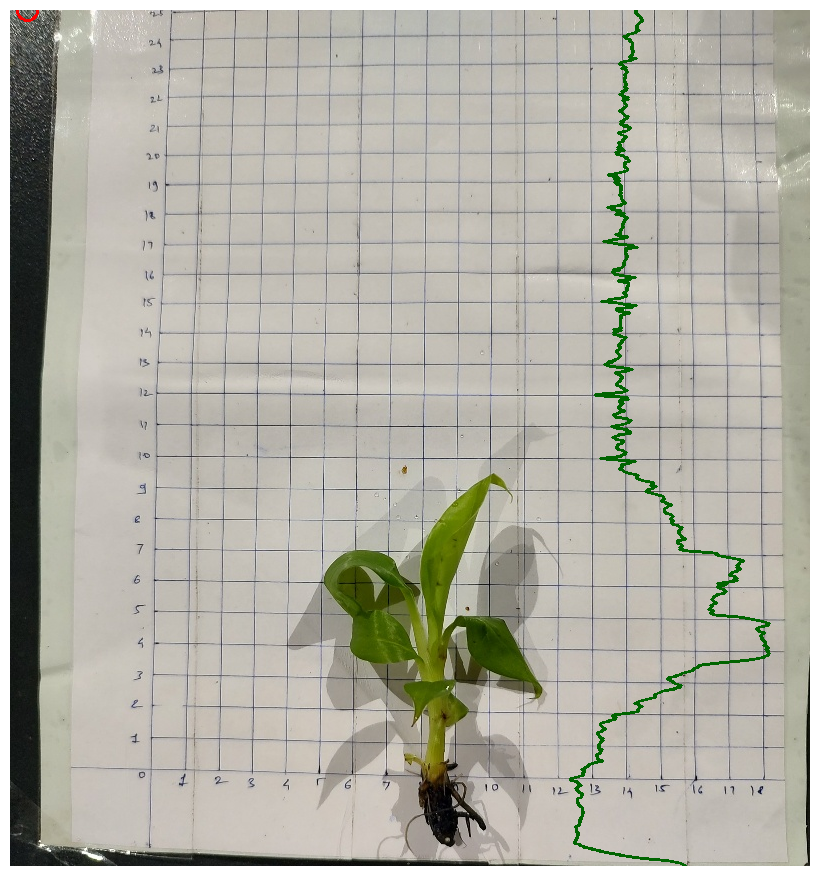

Topmost true green pixel: (np.int64(17), np.int64(0))


In [31]:
pt = find_topmost_true_green(
    r"E:\Jain Irrigation\data\A\train_cropped\IMG_20250920_110830496_HDR.jpg",
    a_thresh=-5
)
print(f"Topmost true green pixel: {pt}")

In [33]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def detect_bottom_blue_line(image_path, show=True, threshold_ratio=0.4):
    """
    Detects the lowest horizontal blue grid line in the image using 'blueness' contrast.
    Returns the y-coordinate of the bottommost blue line.

    threshold_ratio : float
        Fraction of the peak blueness intensity used as a threshold to select valid blue lines.
        Lower values = more sensitive detection.
    """

    # --- Load image ---
    img = cv2.imread(image_path)
    if img is None:
        raise ValueError(f"Could not read image from {image_path}")
    h, w, _ = img.shape

    # --- Compute blueness ---
    b, g, r = cv2.split(img)
    blueness = b.astype(np.float32) - np.maximum(r, g).astype(np.float32)
    blueness = np.clip(blueness, 0, None)
    blueness_norm = cv2.normalize(blueness, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

    # --- Sum blueness per row ---
    row_sum = np.sum(blueness, axis=1)
    smooth = cv2.GaussianBlur(row_sum.reshape(-1, 1), (1, 21), 0).flatten()

    # --- Find rows that are strongly blue ---
    max_val = np.max(smooth)
    strong_rows = np.where(smooth > threshold_ratio * max_val)[0]

    if len(strong_rows) == 0:
        raise ValueError("No strong blue rows detected.")
    
    # --- Take the LOWEST (bottommost) blue line ---
    bottom_y = int(np.max(strong_rows))

    if show:
        fig, axes = plt.subplots(1, 2, figsize=(12, 8))

        # Original image with detected line
        axes[0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        axes[0].axhline(bottom_y, color='blue', linewidth=2)
        axes[0].set_title(f"Original Image\nLowest Blue Line: y = {bottom_y}")
        axes[0].axis("off")

        # Blueness heatmap
        axes[1].imshow(blueness_norm, cmap='Blues')
        axes[1].axhline(bottom_y, color='red', linewidth=2)
        axes[1].set_title("Blueness Map (B - max(R,G))")
        axes[1].axis("off")

        plt.tight_layout()
        plt.show()

    return bottom_y


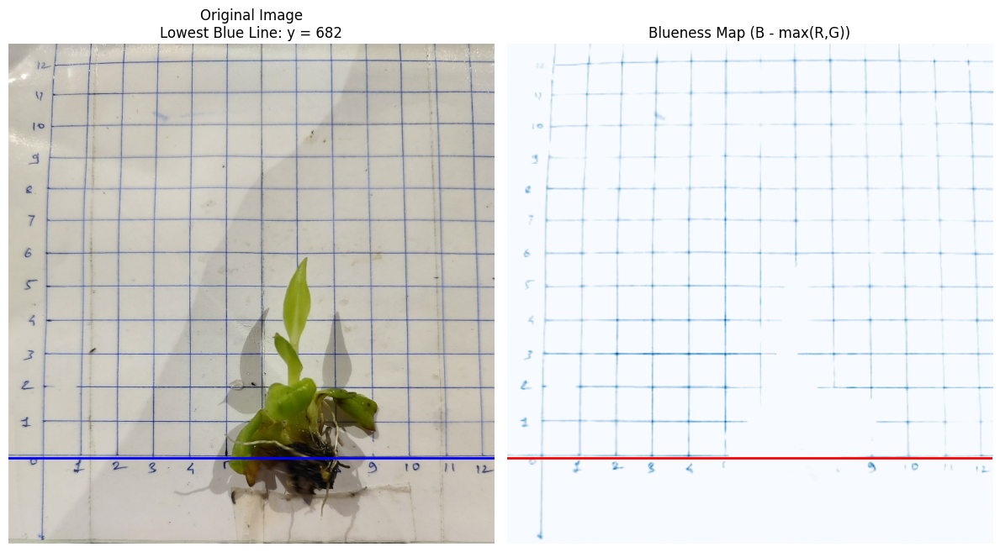

Bottom blue grid line detected at y = 682


In [35]:
bottom_y = detect_bottom_blue_line(
    r"E:\Jain Irrigation\data\B\test_cropped\IMG_20250922_110751212_HDR.jpg"
)
print(f"Bottom blue grid line detected at y = {bottom_y}")

In [38]:
from scipy.signal import find_peaks
def detect_bottom_two_blue_lines(image_path, show=True, threshold_ratio=0.4, min_distance=20):
    """
    Detects the bottom two horizontal blue grid lines and measures their pixel spacing.
    Returns (bottom_line_y, second_bottom_line_y, unit_distance_pixels).
    
    threshold_ratio : float
        Fraction of peak intensity used to filter blue lines.
    min_distance : int
        Minimum pixel distance between two distinct lines (avoids duplicates).
    """

    # --- Load image ---
    img = cv2.imread(image_path)
    if img is None:
        raise ValueError(f"Could not read image from {image_path}")
    h, w, _ = img.shape

    # --- Compute 'blueness' map ---
    b, g, r = cv2.split(img)
    blueness = b.astype(np.float32) - np.maximum(r, g).astype(np.float32)
    blueness = np.clip(blueness, 0, None)
    blueness_norm = cv2.normalize(blueness, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

    # --- Collapse vertically (sum per row) ---
    row_sum = np.sum(blueness, axis=1)
    smooth = cv2.GaussianBlur(row_sum.reshape(-1,1), (1, 21), 0).flatten()

    # --- Detect peaks in blueness profile ---
    peaks, _ = find_peaks(smooth, height=threshold_ratio * np.max(smooth), distance=min_distance)

    # --- Sort peaks (bottommost first) ---
    peaks_sorted = np.sort(peaks)[::-1]  # descending order

    if len(peaks_sorted) < 2:
        raise ValueError("Could not find at least two distinct blue lines.")

    bottom_y = int(peaks_sorted[0])
    second_bottom_y = int(peaks_sorted[1])
    unit_distance = abs(bottom_y - second_bottom_y)

    if show:
        fig, axes = plt.subplots(1, 2, figsize=(12, 8))

        # Original image with detected lines
        axes[0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        axes[0].axhline(bottom_y, color='blue', linewidth=2, label=f"Bottom line y={bottom_y}")
        axes[0].axhline(second_bottom_y, color='cyan', linewidth=2, label=f"Second line y={second_bottom_y}")
        axes[0].set_title(f"Detected Bottom Two Blue Lines\nPixel Gap = {unit_distance}")
        axes[0].legend()
        axes[0].axis("off")

        # Blueness map
        axes[1].imshow(blueness_norm, cmap='Blues')
        axes[1].axhline(bottom_y, color='red', linewidth=2)
        axes[1].axhline(second_bottom_y, color='orange', linewidth=2)
        axes[1].set_title("Blueness Map (B - max(R,G))")
        axes[1].axis("off")

        plt.tight_layout()
        plt.show()

    return bottom_y, second_bottom_y, unit_distance


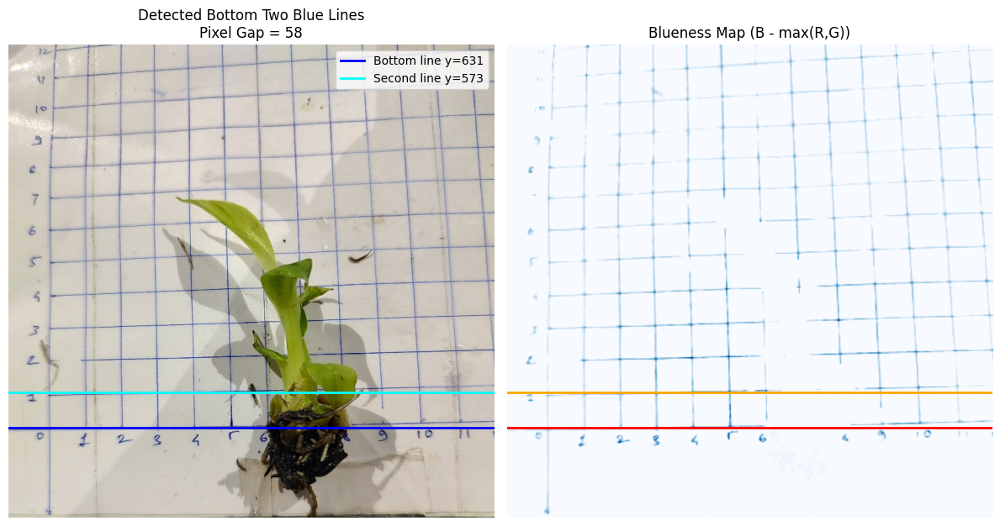

Bottom two blue lines: y=631, 573
Grid spacing (pixel distance): 58


In [39]:
bottom_y, second_bottom_y, unit_px = detect_bottom_two_blue_lines(
    r"E:\Jain Irrigation\data\B\test_cropped\IMG_20250922_105717122_HDR.jpg"
)
print(f"Bottom two blue lines: y={bottom_y}, {second_bottom_y}")
print(f"Grid spacing (pixel distance): {unit_px}")

In [33]:

def find_topmost_true_green(img, a_thresh=-5):
    """Find topmost true green pixel using LAB 'a' channel threshold."""
    lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
    L, a, b = cv2.split(lab)
    a_centered = a.astype(np.float32) - 128
    green_mask = (a_centered < a_thresh).astype(np.uint8)
    ys, xs = np.where(green_mask > 0)
    if len(ys) == 0:
        raise ValueError("No green pixels detected.")
    top_y = int(np.min(ys))
    top_x = int(xs[np.argmin(ys)])
    return top_x, top_y

def detect_bottom_two_blue_lines(img, threshold_ratio=0.4, min_distance=20):
    """Detect bottom two horizontal blue grid lines and return y positions + pixel gap."""
    b, g, r = cv2.split(img)
    blueness = b.astype(np.float32) - np.maximum(r, g).astype(np.float32)
    blueness = np.clip(blueness, 0, None)
    row_sum = np.sum(blueness, axis=1)
    smooth = cv2.GaussianBlur(row_sum.reshape(-1, 1), (1, 21), 0).flatten()

    peaks, _ = find_peaks(smooth, height=threshold_ratio * np.max(smooth), distance=min_distance)
    peaks_sorted = np.sort(peaks)[::-1]

    if len(peaks_sorted) < 2:
        raise ValueError("Could not find at least two distinct blue lines.")
    
    bottom_y = int(peaks_sorted[0])
    second_bottom_y = int(peaks_sorted[1])
    unit_px = abs(bottom_y - second_bottom_y)

    return bottom_y, second_bottom_y, unit_px, blueness

def calculate_leaf_height(top_y, bottom_y, unit_px):
    """Calculate leaf height in pixels and grid units."""
    height_px = bottom_y - top_y
    height_units = height_px / unit_px
    return height_px, height_units

def measure_leaf_height(image_path, a_thresh=-5, threshold_ratio=0.4, min_distance=20, show=True):
    """
    Detects leaf height in pixels and grid units.
    Combines green tip detection + blue grid calibration.
    """

    # --- Load image ---
    img = cv2.imread(image_path)
    if img is None:
        raise ValueError(f"Could not read image from {image_path}")
    h, w, _ = img.shape

    # --- 1. Topmost green pixel ---
    top_x, top_y = find_topmost_true_green(img, a_thresh)

    # --- 2. Bottom two blue lines ---
    bottom_y, second_bottom_y, unit_px, blueness = detect_bottom_two_blue_lines(
        img, threshold_ratio, min_distance
    )

    # --- 3. Height calculations ---
    height_px, height_units = calculate_leaf_height(top_y, bottom_y, unit_px)

    # --- 4. Visualization ---
    if show:
        fig, axes = plt.subplots(1, 2, figsize=(14, 8))

        # Original image with annotations
        overlay = cv2.cvtColor(img.copy(), cv2.COLOR_BGR2RGB)
        cv2.line(overlay, (0, bottom_y), (w, bottom_y), (0, 0, 255), 2)
        cv2.line(overlay, (0, second_bottom_y), (w, second_bottom_y), (255, 0, 0), 2)
        cv2.circle(overlay, (top_x, top_y), 10, (255, 255, 0), 2)

        cv2.putText(overlay, f"Top (x={top_x}, y={top_y})", (top_x + 10, top_y - 10),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 255, 0), 2, cv2.LINE_AA)
        cv2.putText(overlay, f"Bottom Line y={bottom_y}", (20, bottom_y - 10),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 0, 255), 2, cv2.LINE_AA)
        cv2.putText(overlay, f"Second Line y={second_bottom_y}", (20, second_bottom_y - 10),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 0, 0), 2, cv2.LINE_AA)

        cv2.putText(overlay, f"Height: {height_px:.1f}px = {height_units:.2f} units",
                    (20, 40), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 128, 0), 3, cv2.LINE_AA)

        axes[0].imshow(overlay)
        axes[0].set_title("Detected Leaf Height")
        axes[0].axis("off")

        # Blueness map visualization
        blueness_norm = cv2.normalize(blueness, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)
        axes[1].imshow(blueness_norm, cmap='Blues')
        axes[1].axhline(bottom_y, color='red', linewidth=2)
        axes[1].axhline(second_bottom_y, color='orange', linewidth=2)
        axes[1].set_title("Blueness Map (B - max(R,G))")
        axes[1].axis("off")

        plt.tight_layout()
        plt.show()

    print(f"\n✅ Leaf height: {height_px:.1f} px  |  {height_units:.2f} grid units")
    print(f"   Top Y: {top_y} | Bottom Y: {bottom_y} | Unit distance: {unit_px:.1f}px\n")

    return {
        "top_y": top_y,
        "bottom_y": bottom_y,
        "unit_px": unit_px,
        "height_px": height_px,
        "height_units": height_units
    }


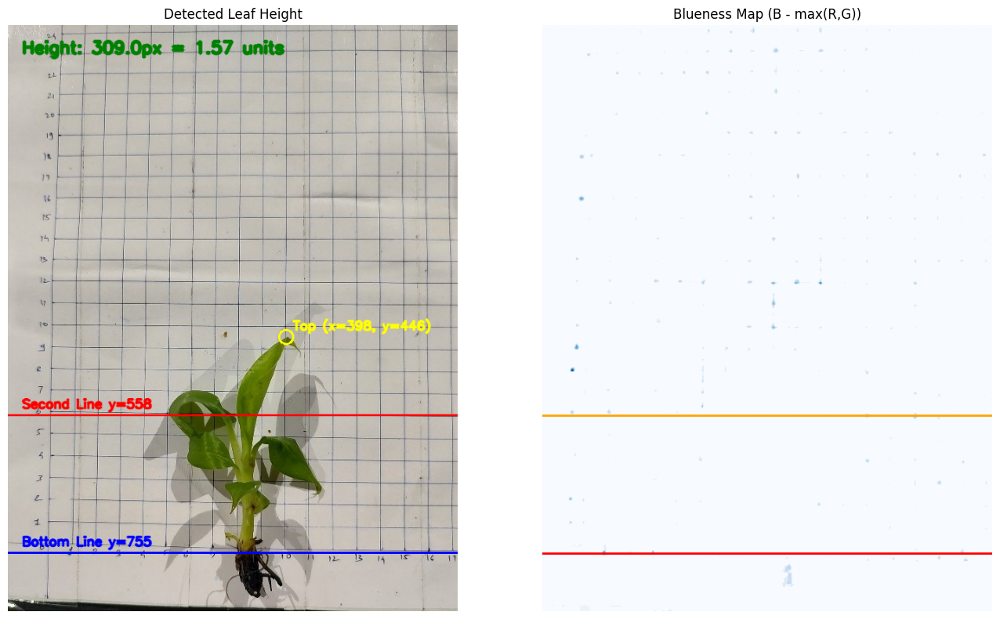


✅ Leaf height: 309.0 px  |  1.57 grid units
   Top Y: 446 | Bottom Y: 755 | Unit distance: 197.0px



In [36]:
result = measure_leaf_height(
    r"E:\Jain Irrigation\data\A\train_cropped\IMG_20250920_110830496_HDR.jpg"
)

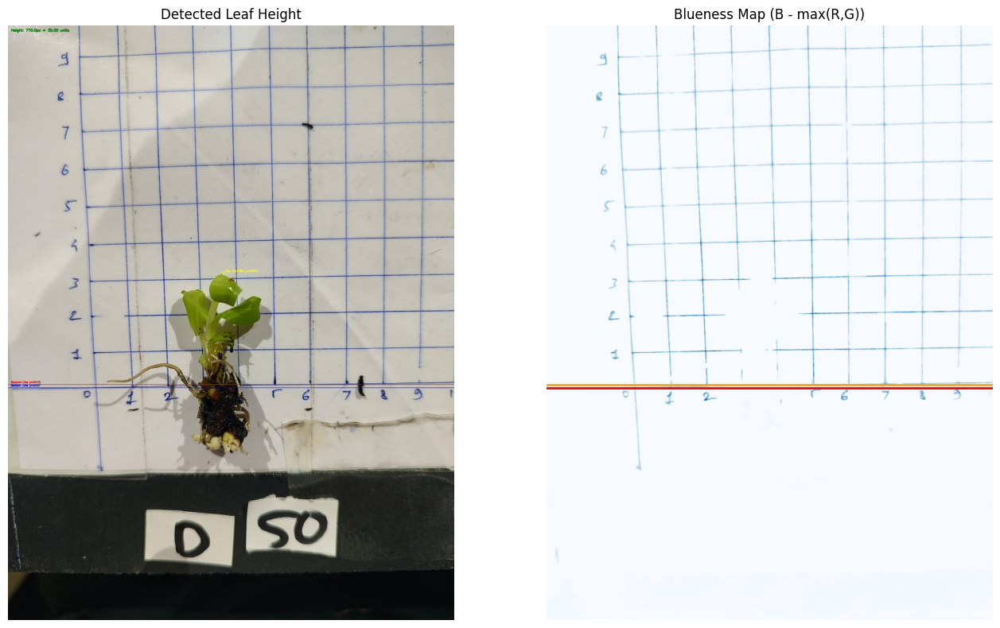


✅ Leaf height: 770.0 px  |  35.00 grid units
   Top Y: 1667 | Bottom Y: 2437 | Unit distance: 22.0px



{'top_y': 1667,
 'bottom_y': 2437,
 'unit_px': 22,
 'height_px': 770,
 'height_units': 35.0}

In [ ]:
result = measure_leaf_height(
    r"E:\Jain Irrigation\data\D\IMG_20250922_121103860_HDR.jpg"
)

In [68]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks


def detect_bottom_two_blue_lines_from_blueness(image_path, show=True, threshold_ratio=0.4, min_distance=20):
    """
    Detects the two bottommost horizontal blue lines directly from the blueness image.
    Returns (bottom_y, second_bottom_y, unit_px, blueness_map).
    """

    # --- Load image ---
    img = cv2.imread(image_path)
    if img is None:
        raise ValueError(f"Could not read image from {image_path}")
    h, w, _ = img.shape

    # --- Compute 'blueness' map ---
    b, g, r = cv2.split(img)
    blueness = b.astype(np.float32) - np.maximum(r, g).astype(np.float32)
    blueness = np.clip(blueness, 0, None)
    blueness_norm = cv2.normalize(blueness, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

    # --- Slightly enhance grid contrast ---
    blueness_blur = cv2.GaussianBlur(blueness_norm, (3, 9), 0)

    # --- Collapse vertically (sum over columns) ---
    row_sum = np.sum(blueness_blur, axis=1)

    # --- Smooth with scipy (avoids OpenCV float issue) ---
    smooth = gaussian_filter1d(row_sum, sigma=8)

    # --- Detect peaks (horizontal lines) ---
    peaks, properties = find_peaks(smooth, height=threshold_ratio * np.max(smooth), distance=min_distance)
    peaks_sorted = np.sort(peaks)[::-1]  # bottommost first

    if len(peaks_sorted) < 2:
        raise ValueError("Could not find at least two distinct blue lines in blueness map.")

    bottom_y = int(peaks_sorted[0])
    second_bottom_y = int(peaks_sorted[1])
    unit_px = abs(bottom_y - second_bottom_y)

    # --- Visualization ---
    if show:
        fig, axes = plt.subplots(1, 2, figsize=(14, 8))

        # Original image with detected lines
        axes[0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        axes[0].axhline(bottom_y, color='blue', linewidth=2, label=f"Bottom line y={bottom_y}")
        axes[0].axhline(second_bottom_y, color='cyan', linewidth=2, label=f"2nd line y={second_bottom_y}")
        axes[0].set_title(f"Original Image\nGrid spacing ≈ {unit_px}px")
        axes[0].legend()
        axes[0].axis("off")

        # Blueness map with lines
        axes[1].imshow(blueness_norm, cmap='Blues')
        axes[1].axhline(bottom_y, color='red', linewidth=2)
        axes[1].axhline(second_bottom_y, color='orange', linewidth=2)
        axes[1].set_title("Detected Lines on Blueness Map")
        axes[1].axis("off")

        plt.tight_layout()
        plt.show()

    return bottom_y, second_bottom_y, unit_px, blueness_norm


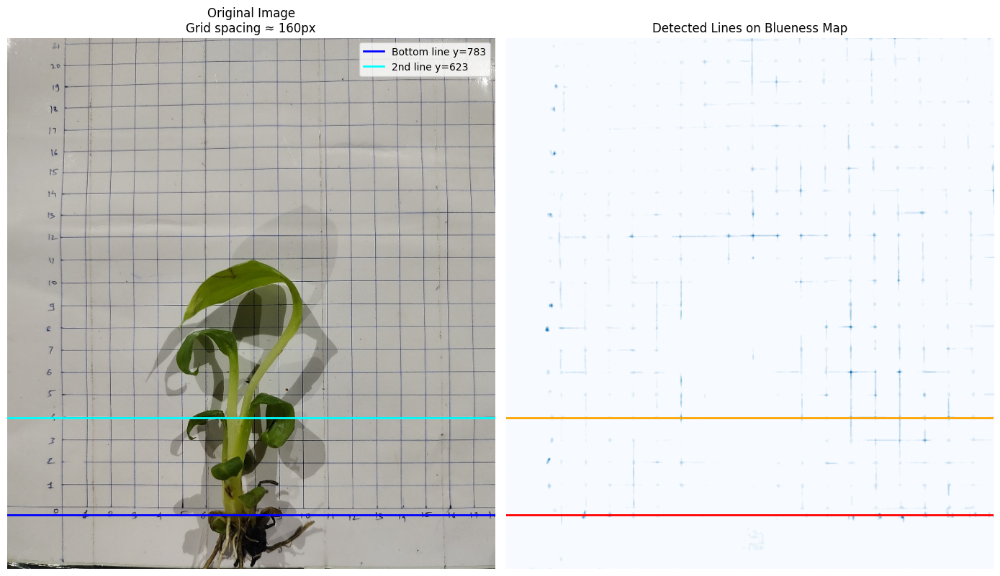

Bottom two blue lines at y = 783, 623 | Unit distance = 160px


In [69]:
bottom_y, second_bottom_y, unit_px, bluemap = detect_bottom_two_blue_lines_from_blueness(
    r"E:\Jain Irrigation\data\A\train_cropped\IMG_20250920_111124376.jpg"
)
print(f"Bottom two blue lines at y = {bottom_y}, {second_bottom_y} | Unit distance = {unit_px}px")


In [89]:
def detect_bottom_two_blue_lines_hybrid(image_path, show=True):
    """
    Detect bottom two horizontal blue grid lines using a hybrid blueness map
    that combines B/(R+G) ratio and Lab −b channel.
    Works reliably for close, far, or unevenly lit images.
    """

    # --- Load image ---
    img = cv2.imread(image_path)
    if img is None:
        raise ValueError(f"Could not read image: {image_path}")
    h, w, _ = img.shape

    # ---------- 1️⃣  Hybrid Blueness Map ----------
    b, g, r = cv2.split(img.astype(np.float32))
    blue_ratio = b / (r + g + 1)

    lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
    _, _, b_lab = cv2.split(lab)
    b_lab_inv = 255 - b_lab.astype(np.float32)

    blueness = blue_ratio * b_lab_inv
    blueness = cv2.normalize(blueness, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

    # ---------- 2️⃣  Adaptive Threshold + Smoothing ----------
    grid_mask = cv2.adaptiveThreshold(
        blueness, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 35, -5
    )
    kernel = np.ones((3, 25), np.uint8)
    grid_mask = cv2.morphologyEx(grid_mask, cv2.MORPH_CLOSE, kernel)

    # ---------- 3️⃣  Vertical Projection ----------
    row_sum = np.sum(grid_mask, axis=1)
    smooth = gaussian_filter1d(row_sum, sigma=5)

    # ---------- 4️⃣  Peak Detection ----------
    peaks, _ = find_peaks(smooth, height=0.3 * np.max(smooth), distance=20)
    if len(peaks) < 2:
        raise ValueError("Less than two grid lines detected — check lighting or distance.")
    peaks_sorted = np.sort(peaks)[::-1]
    bottom_y = int(peaks_sorted[0])
    second_bottom_y = int(peaks_sorted[1])
    unit_px = abs(bottom_y - second_bottom_y)

    # ---------- 5️⃣  Visualisation ----------
    if show:
        fig, axes = plt.subplots(1, 2, figsize=(14, 8))
        axes[0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        axes[0].axhline(bottom_y, color="red", lw=2)
        axes[0].axhline(second_bottom_y, color="orange", lw=2)
        axes[0].set_title(f"Detected Bottom Lines (grid ≈ {unit_px}px)")
        axes[0].axis("off")

        axes[1].imshow(blueness, cmap="Blues")
        axes[1].axhline(bottom_y, color="red", lw=2)
        axes[1].axhline(second_bottom_y, color="orange", lw=2)
        axes[1].set_title("Hybrid Blueness Map + Lines")
        axes[1].axis("off")

        plt.tight_layout()
        plt.show()

    return bottom_y, second_bottom_y, unit_px, blueness

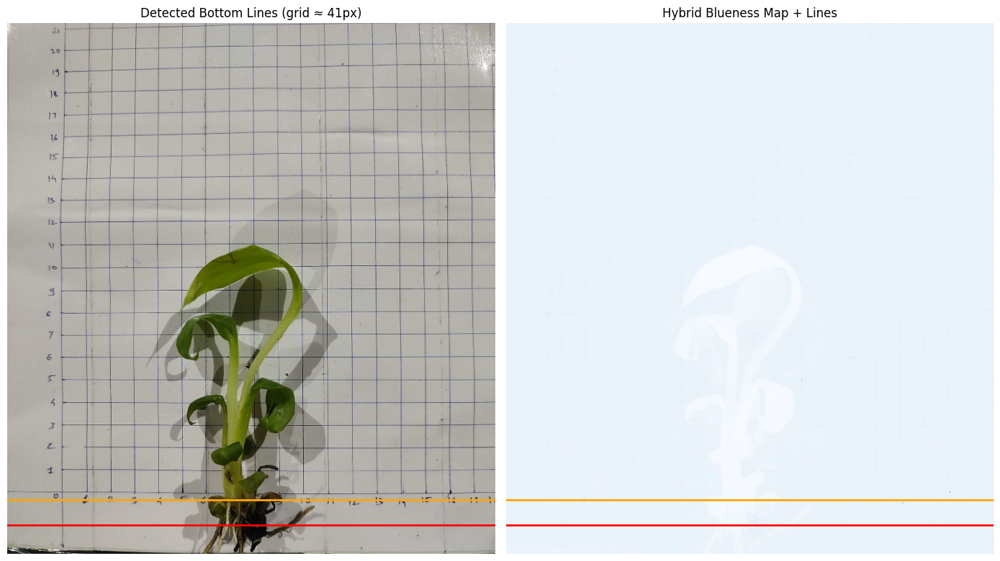

Bottom two lines at y = 824, 783 | Grid spacing ≈ 41px


In [91]:
bottom_y, second_bottom_y, unit_px, bluemap = detect_bottom_two_blue_lines_hybrid(
    r"E:\Jain Irrigation\data\A\train_cropped\IMG_20250920_111124376.jpg"
)
print(f"Bottom two lines at y = {bottom_y}, {second_bottom_y} | Grid spacing ≈ {unit_px}px")

In [21]:
# ---------------- Core Functions ---------------- #

def find_topmost_true_green(img, a_thresh=-5):
    lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
    L, a, b = cv2.split(lab)
    a_centered = a.astype(np.float32) - 128
    green_mask = (a_centered < a_thresh).astype(np.uint8)
    ys, xs = np.where(green_mask > 0)
    if len(ys) == 0:
        return None, None
    top_y = int(np.min(ys))
    top_x = int(xs[np.argmin(ys)])
    return top_x, top_y

def detect_bottom_two_blue_lines_from_blueness(img, threshold_ratio=0.4, min_distance=20):
    b, g, r = cv2.split(img)
    blueness = b.astype(np.float32) - np.maximum(r, g).astype(np.float32)
    blueness = np.clip(blueness, 0, None)
    blueness_norm = cv2.normalize(blueness, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

    blueness_blur = cv2.GaussianBlur(blueness_norm, (3, 9), 0)
    row_sum = np.sum(blueness_blur, axis=1)
    smooth = gaussian_filter1d(row_sum, sigma=8)

    peaks, _ = find_peaks(smooth, height=threshold_ratio * np.max(smooth), distance=min_distance)
    peaks_sorted = np.sort(peaks)[::-1]

    if len(peaks_sorted) < 2:
        return None, None, None, blueness_norm

    bottom_y = int(peaks_sorted[0])
    second_bottom_y = int(peaks_sorted[1])
    unit_px = abs(bottom_y - second_bottom_y)
    return bottom_y, second_bottom_y, unit_px, blueness_norm

def calculate_leaf_height(top_y, bottom_y, unit_px):
    height_px = bottom_y - top_y
    height_units = height_px / unit_px if unit_px else None
    return height_px, height_units


In [22]:
# ---------------- Batch Processing ---------------- #

def process_leaf_folder(input_folder, output_folder, results_csv):
    os.makedirs(output_folder, exist_ok=True)
    results = []

    for filename in os.listdir(input_folder):
        if not filename.lower().endswith(('.jpg', '.jpeg', '.png')):
            continue

        image_path = os.path.join(input_folder, filename)
        img = cv2.imread(image_path)
        if img is None:
            print(f"⚠️ Could not read {filename}")
            continue

        h, w, _ = img.shape
        top_x, top_y = find_topmost_true_green(img)
        bottom_y, second_bottom_y, unit_px, blueness_map = detect_bottom_two_blue_lines_from_blueness(img)

        if None in [top_y, bottom_y, second_bottom_y, unit_px]:
            print(f"❌ Skipped {filename} — missing detections")
            continue

        height_px, height_units = calculate_leaf_height(top_y, bottom_y, unit_px)

        # Draw markings
        overlay = cv2.cvtColor(img.copy(), cv2.COLOR_BGR2RGB)
        cv2.line(overlay, (0, bottom_y), (w, bottom_y), (255, 0, 0), 2)
        cv2.line(overlay, (0, second_bottom_y), (w, second_bottom_y), (0, 255, 255), 2)
        cv2.circle(overlay, (top_x, top_y), 10, (255, 255, 0), 2)

        cv2.putText(overlay, f"H = {height_units:.2f} units ({height_px:.1f}px)",
                    (20, 40), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 128, 0), 3, cv2.LINE_AA)

        out_path = os.path.join(output_folder, f"marked_{filename}")
        cv2.imwrite(out_path, cv2.cvtColor(overlay, cv2.COLOR_RGB2BGR))

        results.append({
            "filename": filename,
            "top_y": top_y,
            "bottom_y": bottom_y,
            "second_bottom_y": second_bottom_y,
            "unit_px": unit_px,
            "height_px": height_px,
            "height_units": height_units
        })

        print(f"✅ Processed {filename} | Height: {height_units:.2f} units")

    # Save results to CSV
    df = pd.DataFrame(results)
    df.to_csv(results_csv, index=False)
    print(f"\n📁 Results saved to: {results_csv}")
    print(f"🖼️ Annotated images saved to: {output_folder}")


In [26]:
def detect_bottom_two_blue_lines_from_blueness(img, threshold_ratio=0.4, min_distance=20, show=True):
    """
    Detects blue grid lines from the image and visualizes all detected peaks.
    """
    # ---------- 1️⃣ Compute Blueness Map ----------
    b, g, r = cv2.split(img)
    blueness = b.astype(np.float32) - np.maximum(r, g).astype(np.float32)
    blueness = np.clip(blueness, 0, None)
    blueness_norm = cv2.normalize(blueness, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

    # ---------- 2️⃣ Smooth Projection ----------
    blueness_blur = cv2.GaussianBlur(blueness_norm, (3, 9), 0)
    row_sum = np.sum(blueness_blur, axis=1)
    smooth = gaussian_filter1d(row_sum, sigma=8)

    # ---------- 3️⃣ Peak Detection ----------
    peaks, _ = find_peaks(smooth, height=threshold_ratio * np.max(smooth), distance=min_distance)
    peaks_sorted = np.sort(peaks)[::-1]

    # ---------- 5️⃣ Select Bottom Two ----------
    if len(peaks_sorted) < 2:
        return None, None, None, blueness_norm

    bottom_y = int(peaks_sorted[0])
    second_bottom_y = int(peaks_sorted[1])
    unit_px = abs(bottom_y - second_bottom_y)

    return bottom_y, second_bottom_y, unit_px, blueness_norm

In [27]:
import pandas as pd

input_folder = r"E:\Jain Irrigation\data\A\train_cropped"
output_folder = r"E:\Jain Irrigation\data\A\output_marked"
results_csv = r"E:\Jain Irrigation\data\A\output_marked\leaf_heights.csv"

process_leaf_folder(input_folder, output_folder, results_csv)

✅ Processed IMG_20250920_110830496_HDR.jpg | Height: 2.37 units
✅ Processed IMG_20250920_110834031.jpg | Height: -0.27 units
✅ Processed IMG_20250920_110933781.jpg | Height: 7.96 units
✅ Processed IMG_20250920_110956857_HDR.jpg | Height: 7.15 units
✅ Processed IMG_20250920_111112931.jpg | Height: 10.64 units
✅ Processed IMG_20250920_111124376.jpg | Height: 2.62 units
✅ Processed IMG_20250920_111159428.jpg | Height: 9.26 units
✅ Processed IMG_20250920_111208760.jpg | Height: 8.07 units
✅ Processed IMG_20250920_111242036.jpg | Height: 4.58 units
✅ Processed IMG_20250920_111256139_HDR.jpg | Height: 9.27 units
✅ Processed IMG_20250920_111345470.jpg | Height: 18.40 units
✅ Processed IMG_20250920_111355663.jpg | Height: 19.15 units
✅ Processed IMG_20250920_111445694_HDR.jpg | Height: 8.98 units
✅ Processed IMG_20250920_111454875.jpg | Height: 0.87 units
✅ Processed IMG_20250920_111515066_HDR.jpg | Height: 4.05 units
✅ Processed IMG_20250920_111526804_HDR.jpg | Height: 6.78 units
✅ Processed 

In [75]:
input_folder = r"E:\Jain Irrigation\data\B\train_cropped"
output_folder = r"E:\Jain Irrigation\data\B\output_marked"
results_csv = r"E:\Jain Irrigation\data\B\output_marked\leaf_heights.csv"

process_leaf_folder(input_folder, output_folder, results_csv)

✅ Processed IMG_20250922_103045727.jpg | Height: 6.78 units
✅ Processed IMG_20250922_103106894.jpg | Height: 6.64 units
✅ Processed IMG_20250922_103214814_HDR.jpg | Height: 6.30 units
✅ Processed IMG_20250922_103222954_HDR.jpg | Height: 8.80 units
✅ Processed IMG_20250922_103256038.jpg | Height: 7.00 units
✅ Processed IMG_20250922_103302336.jpg | Height: 7.06 units
✅ Processed IMG_20250922_103319612.jpg | Height: 6.82 units
✅ Processed IMG_20250922_103326713.jpg | Height: 6.96 units
✅ Processed IMG_20250922_103341024.jpg | Height: 9.34 units
✅ Processed IMG_20250922_103350149.jpg | Height: 6.56 units
✅ Processed IMG_20250922_103416093.jpg | Height: 7.32 units
✅ Processed IMG_20250922_103425856.jpg | Height: 7.24 units
✅ Processed IMG_20250922_103443011.jpg | Height: 6.36 units
✅ Processed IMG_20250922_103454619.jpg | Height: 6.35 units
✅ Processed IMG_20250922_103510331.jpg | Height: 6.76 units
✅ Processed IMG_20250922_103516994_HDR.jpg | Height: 7.04 units
✅ Processed IMG_20250922_103

In [77]:
input_folder = r"E:\Jain Irrigation\data\D\train_cropped"
output_folder = r"E:\Jain Irrigation\data\D\output_marked"
results_csv = r"E:\Jain Irrigation\data\D\output_marked\leaf_heights.csv"

process_leaf_folder(input_folder, output_folder, results_csv)

✅ Processed IMG_20250922_114316616_HDR.jpg | Height: 4.16 units
✅ Processed IMG_20250922_114449940_HDR.jpg | Height: 4.22 units
✅ Processed IMG_20250922_114502555_HDR.jpg | Height: 3.98 units
✅ Processed IMG_20250922_114507545_HDR.jpg | Height: 3.94 units
✅ Processed IMG_20250922_114551542_HDR.jpg | Height: 4.41 units
✅ Processed IMG_20250922_114616898_HDR.jpg | Height: 4.51 units
✅ Processed IMG_20250922_115042202_HDR.jpg | Height: 3.53 units
✅ Processed IMG_20250922_115106628_HDR.jpg | Height: 3.91 units
✅ Processed IMG_20250922_115114226.jpg | Height: 3.74 units
✅ Processed IMG_20250922_115123443_HDR.jpg | Height: 4.00 units
✅ Processed IMG_20250922_115128873_HDR.jpg | Height: 4.24 units
✅ Processed IMG_20250922_115141926_HDR.jpg | Height: 2.94 units
✅ Processed IMG_20250922_115148458_HDR.jpg | Height: 3.17 units
✅ Processed IMG_20250922_115208465_HDR.jpg | Height: 4.92 units
✅ Processed IMG_20250922_115215189_HDR.jpg | Height: 4.77 units
✅ Processed IMG_20250922_115243221_HDR.jpg |

In [76]:
input_folder = r"E:\Jain Irrigation\data\C\train_cropped"
output_folder = r"E:\Jain Irrigation\data\C\output_marked"
results_csv = r"E:\Jain Irrigation\data\C\output_marked\leaf_heights.csv"

process_leaf_folder(input_folder, output_folder, results_csv)

✅ Processed IMG_20250922_110742930.jpg | Height: 5.33 units
✅ Processed IMG_20250922_110751212_HDR.jpg | Height: 5.66 units
✅ Processed IMG_20250922_110805666.jpg | Height: 5.48 units
✅ Processed IMG_20250922_110816734_HDR.jpg | Height: 5.41 units
✅ Processed IMG_20250922_110828804.jpg | Height: 5.45 units
✅ Processed IMG_20250922_110840871_HDR.jpg | Height: 5.68 units
✅ Processed IMG_20250922_110856467_HDR.jpg | Height: 4.89 units
✅ Processed IMG_20250922_110908131_HDR.jpg | Height: 5.56 units
✅ Processed IMG_20250922_110922822_HDR.jpg | Height: 4.91 units
✅ Processed IMG_20250922_110932651_HDR.jpg | Height: 4.82 units
✅ Processed IMG_20250922_111109931.jpg | Height: 5.82 units
✅ Processed IMG_20250922_111118960.jpg | Height: 5.62 units
✅ Processed IMG_20250922_111207757_HDR.jpg | Height: 5.94 units
✅ Processed IMG_20250922_111214089_HDR.jpg | Height: 5.69 units
✅ Processed IMG_20250922_111235016_HDR.jpg | Height: 5.71 units
✅ Processed IMG_20250922_111243586.jpg | Height: 5.43 units


In [61]:
def extract_plant_layer(image_path, show=True, blue_thresh=40):
    """
    Extracts the plant (green/brown) layer by removing blue grid and paper background
    using the inverse of the blueness map.
    
    blue_thresh : int
        Threshold on blueness intensity (lower = stricter, removes more blue)
    """

    img = cv2.imread(image_path)
    if img is None:
        raise ValueError(f"Could not read image: {image_path}")

    # --- Compute blueness map ---
    b, g, r = cv2.split(img)
    blueness = b.astype(np.float32) - np.maximum(r, g).astype(np.float32)
    blueness = np.clip(blueness, 0, None)
    blueness_norm = cv2.normalize(blueness, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

    # --- Create mask for "non-blue" (plant + soil) ---
    mask = cv2.threshold(blueness_norm, blue_thresh, 255, cv2.THRESH_BINARY_INV)[1]

    # --- Optional clean-up ---
    kernel = np.ones((5,5), np.uint8)
    mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel, iterations=2)
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel, iterations=2)

    # --- Apply mask to original image ---
    plant_only = cv2.bitwise_and(img, img, mask=mask)

    if show:
        plt.figure(figsize=(14,6))
        plt.subplot(1,3,1)
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.title("Original Image")
        plt.axis("off")

        plt.subplot(1,3,2)
        plt.imshow(blueness_norm, cmap='Blues')
        plt.title("Blueness Map (B - max(R,G))")
        plt.axis("off")

        plt.subplot(1,3,3)
        plt.imshow(cv2.cvtColor(plant_only, cv2.COLOR_BGR2RGB))
        plt.title("Extracted Plant Layer")
        plt.axis("off")

        plt.tight_layout()
        plt.show()

    return plant_only, mask


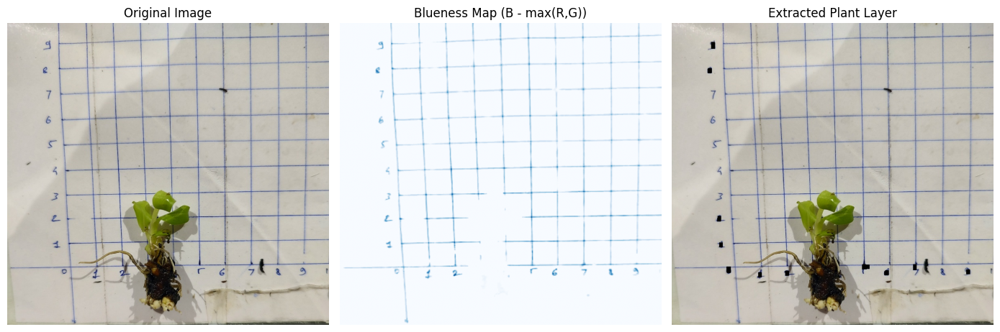

In [62]:
plant_layer, plant_mask = extract_plant_layer(
    r"E:\Jain Irrigation\data\D\test_cropped\IMG_20250922_121103860_HDR.jpg"
)

In [63]:
def remove_blue_grid(image_path, show=True, blue_thresh=30):
    """
    Removes pixels corresponding to blue grid lines by using the blueness map.
    Returns a 'plant only' image where all blue-dominant pixels are black.

    blue_thresh : int
        Threshold on blueness intensity; smaller = keeps more detail.
        Increase if faint grid lines remain.
    """

    # --- Load image ---
    img = cv2.imread(image_path)
    if img is None:
        raise ValueError(f"Could not read image: {image_path}")

    # --- Compute blueness map ---
    b, g, r = cv2.split(img)
    blueness = b.astype(np.float32) - np.maximum(r, g).astype(np.float32)
    blueness = np.clip(blueness, 0, None)
    blueness_norm = cv2.normalize(blueness, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

    # --- Threshold to make binary mask of blue grid lines ---
    mask_blue = cv2.threshold(blueness_norm, blue_thresh, 255, cv2.THRESH_BINARY)[1]

    # --- Invert mask: keep everything that is NOT blue ---
    mask_keep = cv2.bitwise_not(mask_blue)

    # --- Delete blue pixels from the original image ---
    plant_only = cv2.bitwise_and(img, img, mask=mask_keep)

    if show:
        plt.figure(figsize=(14,6))
        plt.subplot(1,3,1)
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.title("Original Image")
        plt.axis("off")

        plt.subplot(1,3,2)
        plt.imshow(blueness_norm, cmap='Blues')
        plt.title("Blueness Map (B - max(R,G))")
        plt.axis("off")

        plt.subplot(1,3,3)
        plt.imshow(cv2.cvtColor(plant_only, cv2.COLOR_BGR2RGB))
        plt.title("Plant Layer (Grid Removed)")
        plt.axis("off")

        plt.tight_layout()
        plt.show()

    return plant_only, mask_keep


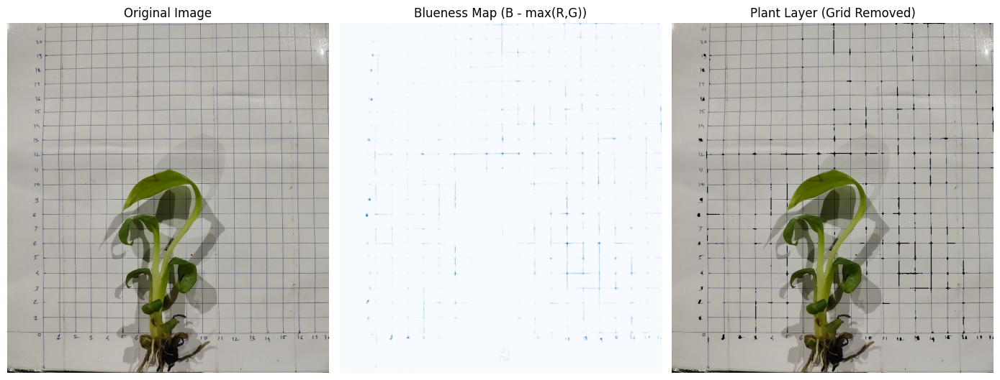

In [ ]:
plant_layer, mask = remove_blue_grid(
    r"E:\Jain Irrigation\data\A\train_cropped\IMG_20250920_111124376.jpg",
    blue_thresh=35
)

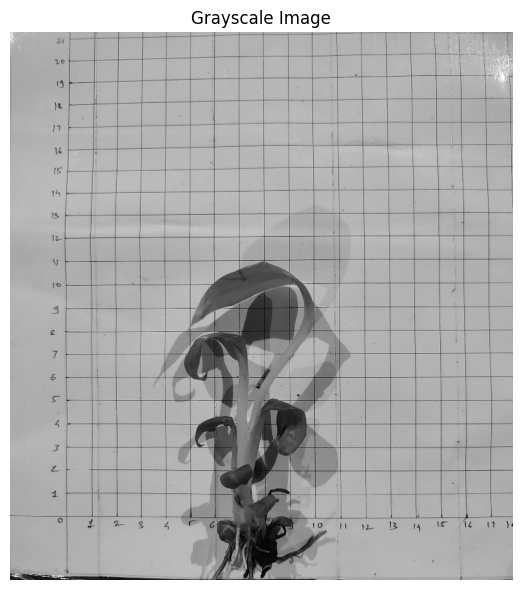

In [6]:
image = cv2.imread(r"E:\Jain Irrigation\data\A\train_cropped\IMG_20250920_111124376.jpg")
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Plot using matplotlib
plt.figure(figsize=(8, 6))
plt.imshow(gray_image, cmap='gray')
plt.title("Grayscale Image")
plt.axis("off")
plt.tight_layout()
plt.show()

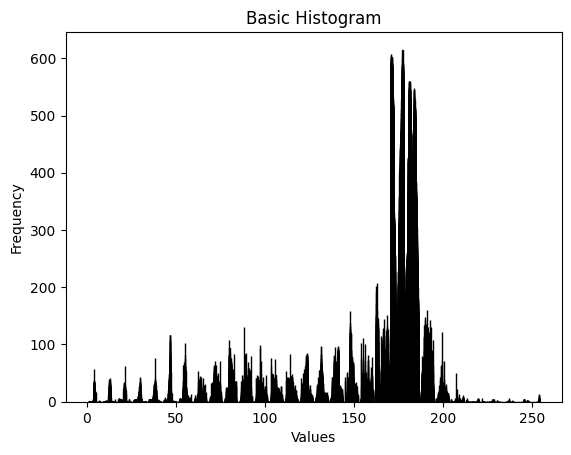

In [5]:
# Plotting a basic histogram
plt.hist(gray_image, bins=30, edgecolor='black')

# Adding labels and title
plt.xlabel('Values')
plt.ylabel('Frequency')
plt.title('Basic Histogram')

# Display the plot
plt.show()

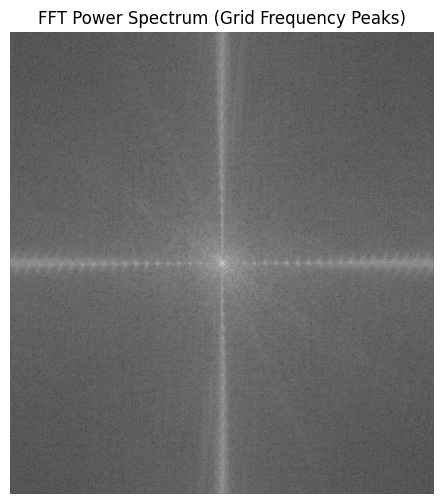

In [8]:
f = np.fft.fft2(gray_image)
fshift = np.fft.fftshift(f)
magnitude = 20 * np.log(np.abs(fshift) + 1)

plt.figure(figsize=(8,6))
plt.imshow(magnitude, cmap='gray')
plt.title("FFT Power Spectrum (Grid Frequency Peaks)")
plt.axis("off")
plt.show()

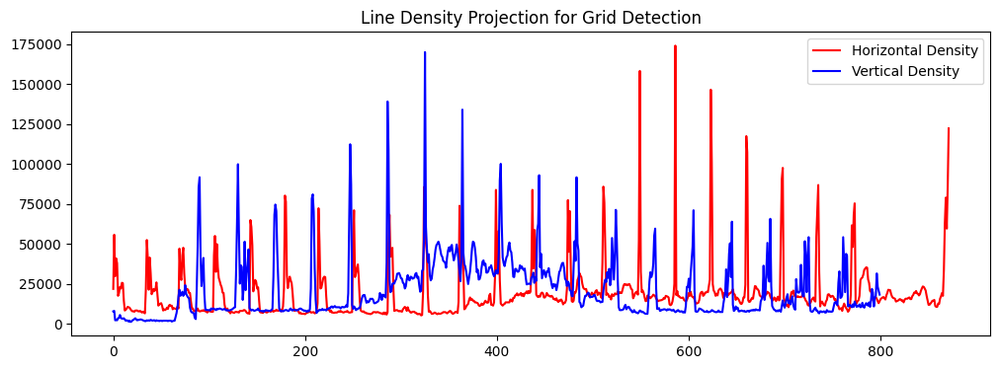

In [ ]:
binary = cv2.adaptiveThreshold(gray_image, 255, cv2.ADAPTIVE_THRESH_MEAN_C,
                               cv2.THRESH_BINARY_INV, 15, 10)
row_sum = np.sum(binary, axis=1)
col_sum = np.sum(binary, axis=0)

plt.figure(figsize=(12,4))
plt.plot(row_sum, color='red', label='Horizontal Density')
plt.plot(col_sum, color='blue', label='Vertical Density')
plt.legend()
plt.title("Line Density Projection for Grid Detection")
plt.show()

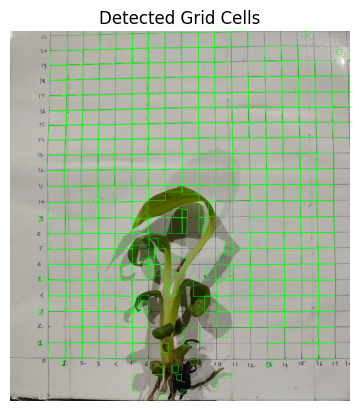

In [13]:
contours, _ = cv2.findContours(binary, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
img_contour = image.copy()
for c in contours:
    x, y, w, h = cv2.boundingRect(c)
    if 10 < w < 60 and 10 < h < 60:  # cell size threshold
        cv2.rectangle(img_contour, (x, y), (x+w, y+h), (0,255,0), 1)

plt.imshow(cv2.cvtColor(img_contour, cv2.COLOR_BGR2RGB))
plt.title("Detected Grid Cells")
plt.axis("off")
plt.show()

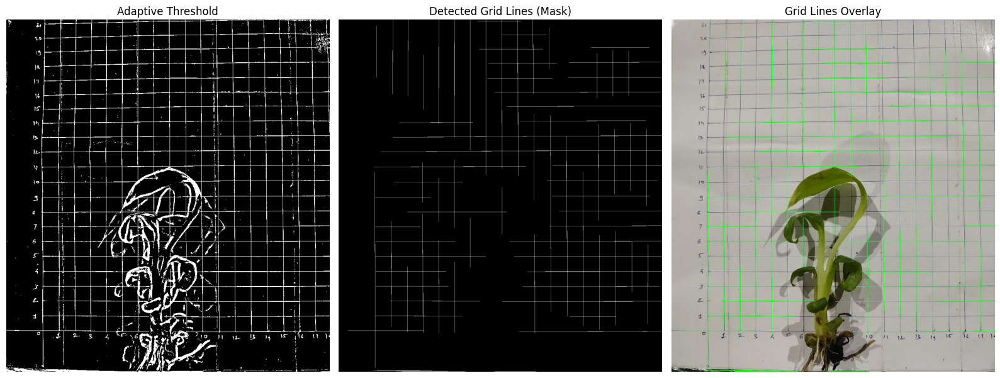

In [15]:
binary = cv2.adaptiveThreshold(
    gray_image, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY_INV, 15, 10
)

# Morphological line extraction
horizontal_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (50, 1))
vertical_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (1, 50))

horizontal_lines = cv2.morphologyEx(binary, cv2.MORPH_OPEN, horizontal_kernel, iterations=2)
vertical_lines = cv2.morphologyEx(binary, cv2.MORPH_OPEN, vertical_kernel, iterations=2)

# Combine the two
grid_mask = cv2.addWeighted(horizontal_lines, 0.5, vertical_lines, 0.5, 0)

# Overlay detected grid lines on original image
overlay = image.copy()
overlay[grid_mask > 0] = [0, 255, 0]  # green overlay for detected lines

# Plot results
plt.figure(figsize=(16, 10))

plt.subplot(1, 3, 1)
plt.imshow(binary, cmap='gray')
plt.title("Adaptive Threshold")
plt.axis("off")

plt.subplot(1, 3, 2)
plt.imshow(grid_mask, cmap='gray')
plt.title("Detected Grid Lines (Mask)")
plt.axis("off")

plt.subplot(1, 3, 3)
plt.imshow(cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB))
plt.title("Grid Lines Overlay")
plt.axis("off")

plt.tight_layout()
plt.show()

✅ Bottom grid line detected at y = 772


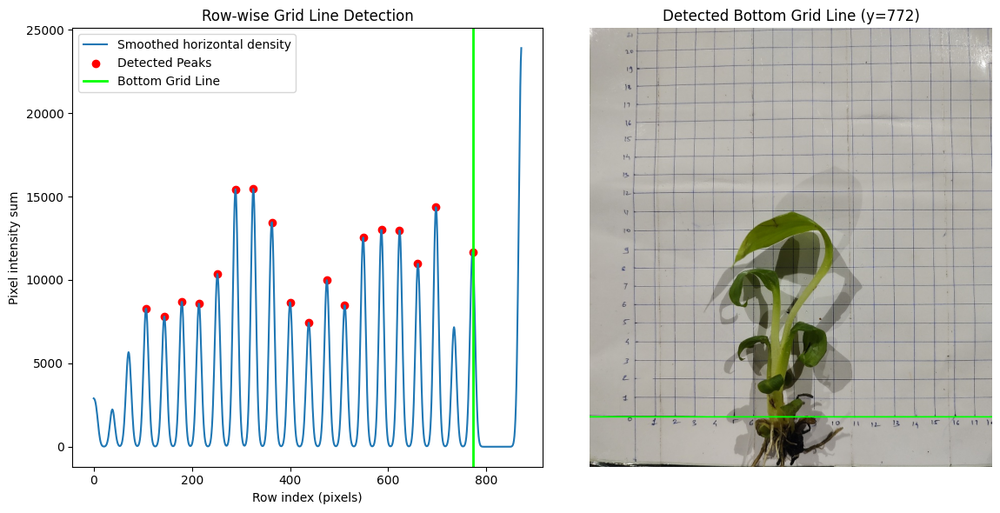

In [17]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks
from scipy.ndimage import gaussian_filter1d  # ✅ use this instead of gaussian/convolve
from scipy.stats import mode

# --- Load image ---
img = cv2.imread(r"E:\Jain Irrigation\data\A\train_cropped\IMG_20250920_111124376.jpg")
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# --- Adaptive threshold ---
binary = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_MEAN_C,
                               cv2.THRESH_BINARY_INV, 15, 10)

# --- Morphological filter (horizontal lines only) ---
horizontal_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (50, 1))
horizontal_lines = cv2.morphologyEx(binary, cv2.MORPH_OPEN, horizontal_kernel, iterations=2)

# --- Compute row-wise density ---
row_sum = np.sum(horizontal_lines, axis=1)
smooth = gaussian_filter1d(row_sum, sigma=5)

# --- Peak detection (horizontal lines) ---
peaks, props = find_peaks(smooth, height=0.3*np.max(smooth), distance=20)

# --- Ignore noisy peaks near top and bottom edges ---
h, w = horizontal_lines.shape
valid_peaks = [p for p in peaks if 0.05*h < p < 0.95*h]

if len(valid_peaks) > 0:
    bottom_y = max(valid_peaks)
    print(f"✅ Bottom grid line detected at y = {bottom_y}")
else:
    print("⚠️ No valid grid lines detected.")
    bottom_y = None

# --- Visualize ---
plt.figure(figsize=(12,6))
plt.subplot(1,2,1)
plt.plot(smooth, label="Smoothed horizontal density")
plt.scatter(valid_peaks, smooth[valid_peaks], color='red', label='Detected Peaks')
plt.axvline(bottom_y, color='lime', lw=2, label='Bottom Grid Line')
plt.legend()
plt.title("Row-wise Grid Line Detection")
plt.xlabel("Row index (pixels)")
plt.ylabel("Pixel intensity sum")

plt.subplot(1,2,2)
overlay = img.copy()
if bottom_y:
    cv2.line(overlay, (0, bottom_y), (w, bottom_y), (0, 255, 0), 2)
plt.imshow(cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB))
plt.title(f"Detected Bottom Grid Line (y={bottom_y})")
plt.axis("off")
plt.tight_layout()
plt.show()

🧩 First periodic grid line detected at y = 107


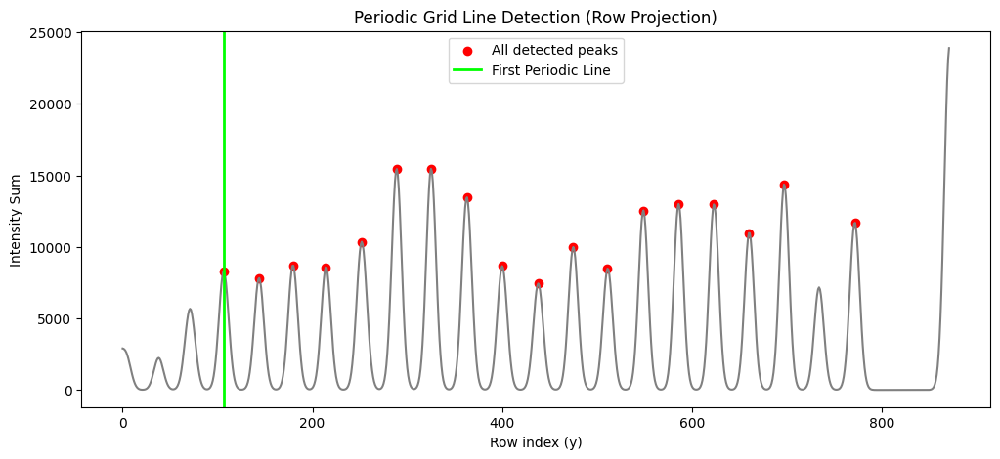

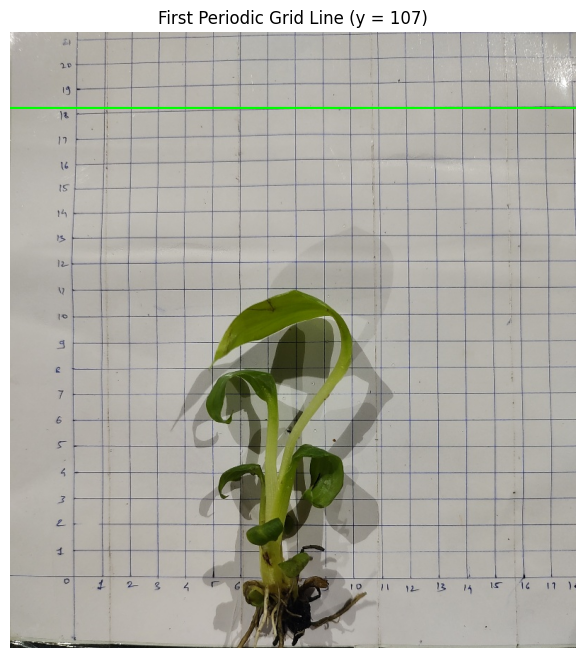

In [18]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks
from scipy.ndimage import gaussian_filter1d
from scipy.stats import mode

# --- Load and preprocess ---
img = cv2.imread(r"E:\Jain Irrigation\data\A\train_cropped\IMG_20250920_111124376.jpg")
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

binary = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_MEAN_C,
                               cv2.THRESH_BINARY_INV, 15, 10)

# --- Extract horizontal structure ---
horizontal_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (50, 1))
horizontal = cv2.morphologyEx(binary, cv2.MORPH_OPEN, horizontal_kernel, iterations=2)

# --- Row projection ---
row_sum = np.sum(horizontal, axis=1)
smooth = gaussian_filter1d(row_sum, sigma=5)

# --- Detect peaks (grid lines) ---
peaks, _ = find_peaks(smooth, height=0.3*np.max(smooth), distance=15)

# --- Compute periodic spacing between peaks ---
if len(peaks) > 2:
    spacings = np.diff(peaks)
    dominant_period = np.median(spacings)
    
    # find first stable periodic section (difference near median)
    stable_idx = np.where(np.abs(spacings - dominant_period) < 0.2 * dominant_period)[0]
    if len(stable_idx) > 0:
        first_periodic_peak = peaks[stable_idx[0]]
    else:
        first_periodic_peak = peaks[0]
else:
    first_periodic_peak = peaks[0] if len(peaks) > 0 else None

print(f"🧩 First periodic grid line detected at y = {first_periodic_peak}")

# --- Visualize ---
plt.figure(figsize=(12, 5))
plt.plot(smooth, color='gray')
plt.scatter(peaks, smooth[peaks], color='red', label='All detected peaks')
if first_periodic_peak is not None:
    plt.axvline(first_periodic_peak, color='lime', lw=2, label='First Periodic Line')
plt.legend()
plt.title("Periodic Grid Line Detection (Row Projection)")
plt.xlabel("Row index (y)")
plt.ylabel("Intensity Sum")
plt.show()

# --- Overlay on image ---
overlay = img.copy()
if first_periodic_peak is not None:
    cv2.line(overlay, (0, int(first_periodic_peak)), (img.shape[1], int(first_periodic_peak)), (0, 255, 0), 2)

plt.figure(figsize=(8, 8))
plt.imshow(cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB))
plt.title(f"First Periodic Grid Line (y = {first_periodic_peak})")
plt.axis("off")
plt.show()


✅ Bottom grid line at y = 772
✅ Second bottom grid line at y = 734
📏 Grid spacing (unit_px) = 38


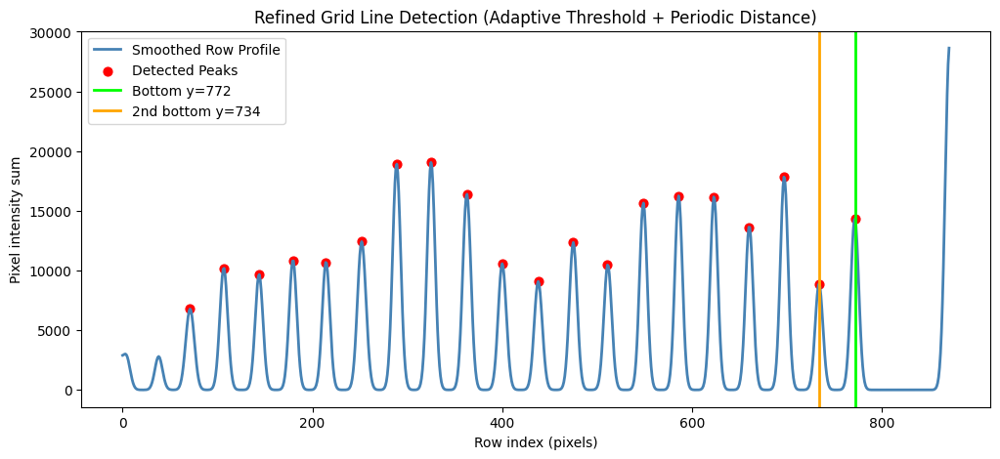

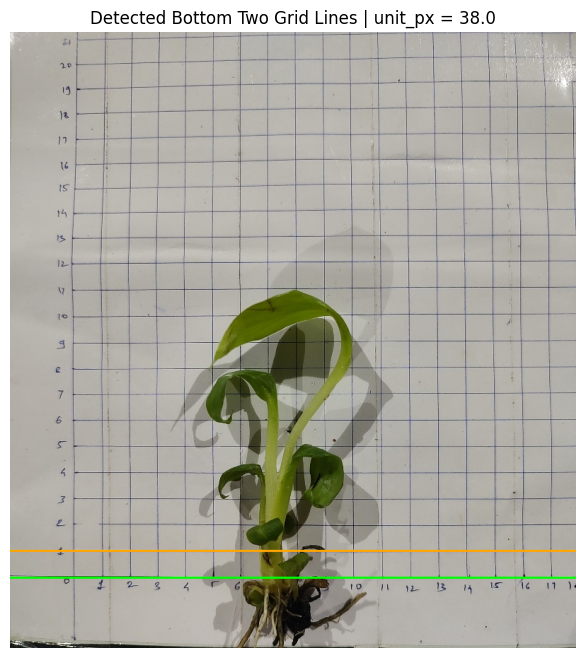

In [19]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks
from scipy.ndimage import gaussian_filter1d

# --- Load & preprocess ---
img = cv2.imread(r"E:\Jain Irrigation\data\A\train_cropped\IMG_20250920_111124376.jpg")
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

binary = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_MEAN_C,
                               cv2.THRESH_BINARY_INV, 15, 10)
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (50, 1))
horizontal = cv2.morphologyEx(binary, cv2.MORPH_OPEN, kernel, iterations=2)

# --- Row-sum profile ---
row_sum = np.sum(horizontal, axis=1)
smooth = gaussian_filter1d(row_sum, sigma=4)

# --- Estimate expected grid spacing automatically ---
peaks_temp, _ = find_peaks(smooth, distance=10)
if len(peaks_temp) > 2:
    avg_spacing = np.median(np.diff(peaks_temp))
else:
    avg_spacing = 50  # fallback guess

# --- Adaptive thresholds ---
height_thresh = 0.22 * np.max(smooth)      # slightly below earlier 0.3×max
prominence_thresh = 0.05 * np.max(smooth)  # to ignore noise
min_distance = int(0.7 * avg_spacing)      # a bit less than grid spacing

# --- Final peak detection ---
peaks, props = find_peaks(
    smooth,
    height=height_thresh,
    distance=min_distance,
    prominence=prominence_thresh
)

# --- Sort & identify bottom two ---
sorted_peaks = np.sort(peaks)
bottom_y = sorted_peaks[-1] if len(sorted_peaks) > 0 else None
second_bottom_y = sorted_peaks[-2] if len(sorted_peaks) > 1 else None
unit_px = abs(bottom_y - second_bottom_y) if second_bottom_y is not None else None

print(f"✅ Bottom grid line at y = {bottom_y}")
print(f"✅ Second bottom grid line at y = {second_bottom_y}")
print(f"📏 Grid spacing (unit_px) = {unit_px}")

# --- Visualization: row profile ---
plt.figure(figsize=(12,5))
plt.plot(smooth, color='steelblue', lw=2, label="Smoothed Row Profile")
plt.scatter(peaks, smooth[peaks], color='red', s=40, label='Detected Peaks')
if bottom_y: plt.axvline(bottom_y, color='lime', lw=2, label=f'Bottom y={bottom_y}')
if second_bottom_y: plt.axvline(second_bottom_y, color='orange', lw=2, label=f'2nd bottom y={second_bottom_y}')
plt.legend()
plt.title("Refined Grid Line Detection (Adaptive Threshold + Periodic Distance)")
plt.xlabel("Row index (pixels)")
plt.ylabel("Pixel intensity sum")
plt.show()

# --- Overlay on image ---
overlay = img.copy()
h, w = img.shape[:2]
if bottom_y:
    cv2.line(overlay, (0, int(bottom_y)), (w, int(bottom_y)), (0,255,0), 2)
if second_bottom_y:
    cv2.line(overlay, (0, int(second_bottom_y)), (w, int(second_bottom_y)), (0,165,255), 2)
plt.figure(figsize=(8,8))
plt.imshow(cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB))
plt.title(f"Detected Bottom Two Grid Lines | unit_px = {unit_px:.1f}")
plt.axis("off")
plt.show()

In [20]:
import cv2
import numpy as np
import os
import pandas as pd
from scipy.signal import find_peaks
from scipy.ndimage import gaussian_filter1d

# ------------------------------------------------------------
# 1️⃣ Detect topmost true green region (leaf tip)
# ------------------------------------------------------------
def find_topmost_true_green(img, a_thresh=-5):
    lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
    _, a, _ = cv2.split(lab)
    a_centered = a.astype(np.float32) - 128
    green_mask = (a_centered < a_thresh).astype(np.uint8)
    ys, xs = np.where(green_mask > 0)
    if len(ys) == 0:
        return None, None
    top_y = int(np.min(ys))
    top_x = int(xs[np.argmin(ys)])
    return top_x, top_y


# ------------------------------------------------------------
# 2️⃣ Detect bottom two horizontal grid lines via projection peaks
# ------------------------------------------------------------
def detect_bottom_two_grid_lines(img, smooth_sigma=4, show=False):
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Adaptive threshold + horizontal morphology
    binary = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_MEAN_C,
                                   cv2.THRESH_BINARY_INV, 15, 10)
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (50, 1))
    horizontal = cv2.morphologyEx(binary, cv2.MORPH_OPEN, kernel, iterations=2)

    # Row-wise projection
    row_sum = np.sum(horizontal, axis=1)
    smooth = gaussian_filter1d(row_sum, sigma=smooth_sigma)

    # Estimate spacing & adaptive thresholds
    peaks_temp, _ = find_peaks(smooth, distance=10)
    avg_spacing = np.median(np.diff(peaks_temp)) if len(peaks_temp) > 2 else 50

    height_thresh = 0.22 * np.max(smooth)
    prominence_thresh = 0.05 * np.max(smooth)
    min_distance = int(0.7 * avg_spacing)

    peaks, _ = find_peaks(smooth,
                          height=height_thresh,
                          distance=min_distance,
                          prominence=prominence_thresh)
    peaks_sorted = np.sort(peaks)
    if len(peaks_sorted) < 2:
        return None, None, None, horizontal

    bottom_y = int(peaks_sorted[-1])
    second_bottom_y = int(peaks_sorted[-2])
    unit_px = abs(bottom_y - second_bottom_y)

    if show:
        import matplotlib.pyplot as plt
        plt.figure(figsize=(12, 5))
        plt.plot(smooth, lw=2, color="steelblue", label="Smoothed Row Profile")
        plt.scatter(peaks, smooth[peaks], color="red", s=40, label="Detected Peaks")
        plt.axvline(bottom_y, color="lime", lw=2, label=f"Bottom y={bottom_y}")
        plt.axvline(second_bottom_y, color="orange", lw=2, label=f"2nd Bottom y={second_bottom_y}")
        plt.legend()
        plt.title("Detected Grid Lines via Projection Peaks")
        plt.show()

    return bottom_y, second_bottom_y, unit_px, horizontal


# ------------------------------------------------------------
# 3️⃣ Convert pixel height to grid-relative units
# ------------------------------------------------------------
def calculate_leaf_height(top_y, bottom_y, unit_px):
    height_px = bottom_y - top_y
    height_units = height_px / unit_px if unit_px else None
    return height_px, height_units


# ------------------------------------------------------------
# 4️⃣ Batch processing over folder
# ------------------------------------------------------------
def process_leaf_folder(input_folder, output_folder, results_csv):
    os.makedirs(output_folder, exist_ok=True)
    results = []

    for filename in os.listdir(input_folder):
        if not filename.lower().endswith((".jpg", ".jpeg", ".png")):
            continue

        path = os.path.join(input_folder, filename)
        img = cv2.imread(path)
        if img is None:
            print(f"⚠️ Could not read {filename}")
            continue

        h, w, _ = img.shape

        top_x, top_y = find_topmost_true_green(img)
        bottom_y, second_bottom_y, unit_px, grid_mask = detect_bottom_two_grid_lines(img)

        if None in [top_y, bottom_y, second_bottom_y, unit_px]:
            print(f"❌ Skipped {filename} — missing detections")
            continue

        height_px, height_units = calculate_leaf_height(top_y, bottom_y, unit_px)

        # ---------- Draw Markings ----------
        overlay = cv2.cvtColor(img.copy(), cv2.COLOR_BGR2RGB)
        cv2.line(overlay, (0, bottom_y), (w, bottom_y), (0, 255, 0), 2)
        cv2.line(overlay, (0, second_bottom_y), (w, second_bottom_y), (0, 165, 255), 2)
        cv2.circle(overlay, (top_x, top_y), 10, (255, 255, 0), 2)
        cv2.putText(overlay, f"H = {height_units:.2f} units ({height_px:.1f}px)",
                    (20, 40), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 128, 0), 3, cv2.LINE_AA)

        out_path = os.path.join(output_folder, f"marked_{filename}")
        cv2.imwrite(out_path, cv2.cvtColor(overlay, cv2.COLOR_RGB2BGR))

        results.append({
            "filename": filename,
            "top_y": top_y,
            "bottom_y": bottom_y,
            "second_bottom_y": second_bottom_y,
            "unit_px": unit_px,
            "height_px": height_px,
            "height_units": height_units
        })

        print(f"✅ Processed {filename} | Height: {height_units:.2f} units")

    # ---------- Save to CSV ----------
    df = pd.DataFrame(results)
    df.to_csv(results_csv, index=False)
    print(f"\n📁 Results saved to: {results_csv}")
    print(f"🖼️ Annotated images saved to: {output_folder}")


# ------------------------------------------------------------
# 5️⃣ Run
# ------------------------------------------------------------
input_folder = r"E:\Jain Irrigation\data\A\train_cropped"
output_folder = r"E:\Jain Irrigation\data\A\output_marked"
results_csv = r"E:\Jain Irrigation\data\A\output_marked\leaf_heights.csv"

process_leaf_folder(input_folder, output_folder, results_csv)


✅ Processed IMG_20250920_110830496_HDR.jpg | Height: 14.00 units
✅ Processed IMG_20250920_110834031.jpg | Height: -1.55 units
✅ Processed IMG_20250920_110933781.jpg | Height: 4.99 units
✅ Processed IMG_20250920_110956857_HDR.jpg | Height: 9.32 units
✅ Processed IMG_20250920_111112931.jpg | Height: 22.94 units
✅ Processed IMG_20250920_111124376.jpg | Height: 10.76 units
❌ Skipped IMG_20250920_111159428.jpg — missing detections
✅ Processed IMG_20250920_111208760.jpg | Height: 4.80 units
❌ Skipped IMG_20250920_111242036.jpg — missing detections
✅ Processed IMG_20250920_111256139_HDR.jpg | Height: 1.11 units
✅ Processed IMG_20250920_111345470.jpg | Height: 20.28 units
✅ Processed IMG_20250920_111355663.jpg | Height: 22.94 units
✅ Processed IMG_20250920_111445694_HDR.jpg | Height: 10.14 units
✅ Processed IMG_20250920_111454875.jpg | Height: 10.39 units
✅ Processed IMG_20250920_111515066_HDR.jpg | Height: 4.40 units
✅ Processed IMG_20250920_111526804_HDR.jpg | Height: 7.76 units
✅ Processed 